## Workflow for processing data coming from OT2 
- 2025/03/18 Runze
- Deposition: OCV --> CP --> OCV
- Characterization: CV --> PEIS --> LP

In [460]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import os
import autoeis as ae
import arviz as az
import seaborn as sns
import matplotlib.cm as cm
import matplotlib.colors as mcolors


### Specify the experiments


In [461]:
# batch 1 20250310 substrate test

file_path = "/home/runzezhang/Data/OT2/20250311_substrate test"
substrate_dict = {
    "MGL_front1": "20250310_000", "MGL_front2": "20250310_001", "MGL_front3": "20250310_002",
    "MGL_back1": "20250310_003", "MGL_back2": "20250310_004", "MGL_back3": "20250310_005",
    "398b_front1": "20250310_006", "398b_front2": "20250310_007", "398b_front3": "20250310_008",
    "398b_back1": "20250310_009", "398b_back2": "20250310_010", "398b_back3": "20250310_011",
    "590937_front1": "20250310_012", "590937_front2": "20250310_013", "590937_front3": "20250310_014"
}

In [462]:
# batch 2 20250311

file_path = "/home/runzezhang/Data/OT2/20250311_substrate test"
substrate_dict = {
    "590937_back1": "20250311_000", "590937_back2": "20250311_001", "590937_back3": "20250311_002",
    "625303_back1": "20250311_003", "625303_back2": "20250311_004", "625303_back3": "20250311_005",
    "625303_front1": "20250311_006", "625303_front2": "20250311_007", "625303_front3": "20250311_008",
    "592057_back1": "20250311_009", "592057_back2": "20250311_010", "592057_back3": "20250311_011",
    "592507_front1": "20250311_012", "592507_front2": "20250311_013", "592507_front3": "20250311_014"
}

In [463]:
# batch 3 20250312-20250314 (repeated batch 1)

file_path = "/home/runzezhang/Data/OT2/20250314_substrate test"
substrate_dict = {
    "MGL_front1": "20250312_000", "MGL_front2": "20250313_001", "MGL_front3": "20250314_002",
    "MGL_back1": "20250314_003", "MGL_back2": "20250314_004", "MGL_back3": "20250314_005",
    "398b_front1": "20250314_006", "398b_front2": "20250314_007", "398b_front3": "20250314_008",
    "398b_back1": "20250314_009", "398b_back2": "20250314_010", "398b_back3": "20250314_011",
    "590937_front1": "20250314_012", "590937_front2": "20250314_013", "590937_front3": "20250314_014"
}


In [464]:
# batch 4 20250315 

file_path = "/home/runzezhang/Data/OT2/20250315_substrate test"
substrate_dict = {
    "MGL_front1": "20250315_000", "MGL_front2": "20250315_001", "MGL_front3": "20250315_002",
    "MGL190_1": "20250315_003", "MGL190_2": "20250315_004", "MGL190_3": "20250315_005",
    "Hydrophilic_light_1": "20250315_006", "Hydrophilic_light_2": "20250315_007", "Hydrophilic_light_3": "20250315_008",
    "Hydrophilic_dark_1": "20250315_009", "Hydrophilic_dark_2": "20250315_010", "Hydrophilic_dark_3": "20250315_011"
}


### Load the data

In [465]:
substrate_id = "MGL190_1"

In [466]:
# load deposition folder

deposition_folder = file_path + f"/{substrate_dict[substrate_id]}" +"/deposition"
characterization_folder = file_path + f"/{substrate_dict[substrate_id]}" +"/characterization"

# load deposition data
dep_files = os.listdir(deposition_folder)
charc_files = os.listdir(characterization_folder)

# Filter files based on the measurement type and ensure they end with '.mpr'
dep_ocv0_path = [f for f in dep_files if "_0_ocv" in f and f.endswith('.csv')]
dep_cp1_path = [f for f in dep_files if "_1_cp" in f and f.endswith('.csv')]
dep_ocv2_path = [f for f in dep_files if "_2_ocv" in f and f.endswith('.csv')]

chara_cv0_path = [f for f in charc_files if "_0_cv" in f and f.endswith('.csv')]
chara_peis1_path = [f for f in charc_files if "_1_peis" in f and f.endswith('.csv')]
chara_lp2_path = [f for f in charc_files if "_2_lp" in f and f.endswith('.csv')]
chara_lp3_path = [f for f in charc_files if "_3_lp" in f and f.endswith('.csv')]

# Load data
dep_ocv0 = pd.read_csv(deposition_folder + '/' + dep_ocv0_path[0])
dep_cp1 = pd.read_csv(deposition_folder + '/' + dep_cp1_path[0])
dep_ocv2 = pd.read_csv(deposition_folder + '/' + dep_ocv2_path[0])

chara_cv0 = pd.read_csv(characterization_folder + '/' + chara_cv0_path[0])
chara_peis1 = pd.read_csv(characterization_folder + '/' + chara_peis1_path[0])
chara_lp2 = pd.read_csv(characterization_folder + '/' + chara_lp2_path[0])
chara_lp3 = pd.read_csv(characterization_folder + '/' + chara_lp3_path[0])

In [467]:
chara_lp3

,Unnamed: 0,time,total_time,Ec,I_avg,Ewe_avg
0,0,0.061640,334.875640,0.000165,0.008488,-0.004822
1,1,0.307920,335.121920,0.001396,0.007992,0.000751
2,2,0.554160,335.368160,0.002628,0.007965,0.002030
3,3,0.800440,335.614440,0.003859,0.007965,0.003308
4,4,1.046720,335.860720,0.005090,0.007971,0.004568
...,...,...,...,...,...,...
808,808,199.043515,533.857515,0.995074,0.017121,0.994644
809,809,199.289795,534.103795,0.996306,0.017150,0.995771
810,810,199.536075,534.350075,0.997537,0.017187,0.997053
811,811,199.782315,534.596315,0.998768,0.017225,0.998329


In [468]:
# Create figure directories if they don’t exist
deposition_fig_folder = os.path.join(deposition_folder, "figures")
characterization_fig_folder = os.path.join(characterization_folder, "figures")

os.makedirs(deposition_fig_folder, exist_ok=True)
os.makedirs(characterization_fig_folder, exist_ok=True)

### Single test

In [469]:
deposition_folder = "/home/runzezhang/Data/OT2/20250326_014/20250326_014/deposition"
characterization_folder = "/home/runzezhang/Data/OT2/20250326_014/20250326_014/characterization"


# load deposition data
dep_files = os.listdir(deposition_folder)
charc_files = os.listdir(characterization_folder)

# Filter files based on the measurement type and ensure they end with '.mpr'
dep_ocv0_path = [f for f in dep_files if "_0_ocv" in f and f.endswith('.csv')]
dep_cp1_path = [f for f in dep_files if "_1_cp" in f and f.endswith('.csv')]
dep_ocv2_path = [f for f in dep_files if "_2_ocv" in f and f.endswith('.csv')]

chara_cv0_path = [f for f in charc_files if "_cv_0" in f and f.endswith('.csv')]
chara_peis1_path = [f for f in charc_files if "_peis_1" in f and f.endswith('.csv')]
chara_cv2_path = [f for f in charc_files if "_cv_2" in f and f.endswith('.csv')]
chara_cv3_path = [f for f in charc_files if "_cv_3" in f and f.endswith('.csv')]
chara_peis4_path = [f for f in charc_files if "_peis_4" in f and f.endswith('.csv')]
chara_lsv5_path = [f for f in charc_files if "_lsv_5" in f and f.endswith('.csv')]
chara_cv6_path = [f for f in charc_files if "_cv_6" in f and f.endswith('.csv')]

# Load data
dep_ocv0 = pd.read_csv(deposition_folder + '/' + dep_ocv0_path[0])
dep_cp1 = pd.read_csv(deposition_folder + '/' + dep_cp1_path[0])
dep_ocv2 = pd.read_csv(deposition_folder + '/' + dep_ocv2_path[0])

chara_cv0 = pd.read_csv(characterization_folder + '/' + chara_cv0_path[0])
chara_peis1 = pd.read_csv(characterization_folder + '/' + chara_peis1_path[0])
chara_cv2 = pd.read_csv(characterization_folder + '/' + chara_cv2_path[0])
chara_cv3 = pd.read_csv(characterization_folder + '/' + chara_cv3_path[0])
chara_peis4 = pd.read_csv(characterization_folder + '/' + chara_peis4_path[0])
chara_lsv5 = pd.read_csv(characterization_folder + '/' + chara_lsv5_path[0])
chara_cv6 = pd.read_csv(characterization_folder + '/' + chara_cv6_path[0])


IndexError: list index out of range

In [ ]:
chara_lsv5

,time,total_time,Ewe,Ec,I_avg,Ewe_avg
0,0.000000,2941.097000,-0.245541,NaN,NaN,NaN
1,0.000640,2941.097640,-0.256235,NaN,NaN,NaN
2,0.001360,2941.098360,-0.266623,NaN,NaN,NaN
3,0.002120,2941.099120,-0.276782,NaN,NaN,NaN
4,0.002920,2941.099920,-0.287018,NaN,NaN,NaN
...,...,...,...,...,...,...
868,199.038955,3145.198955,NaN,0.995172,0.004244,0.994741
869,199.285195,3145.445195,NaN,0.996403,0.004259,0.995894
870,199.531475,3145.691475,NaN,0.997635,0.004276,0.997106
871,199.777715,3145.937715,NaN,0.998866,0.004291,0.998415


In [ ]:
# Create figure directories if they don’t exist
deposition_fig_folder = os.path.join(deposition_folder, "figures")
characterization_fig_folder = os.path.join(characterization_folder, "figures")

os.makedirs(deposition_fig_folder, exist_ok=True)
os.makedirs(characterization_fig_folder, exist_ok=True)

### Define functions to process different kind of measurements

In [ ]:

# Function to save figures (optional)
def save_plot(fig, filename, folder, save=True):
    if save:
        file_path = os.path.join(folder, filename)
        fig.savefig(file_path, dpi=300, bbox_inches='tight')
        plt.close(fig)  # Close the figure to free memory

# Define plotting functions with optional saving
def plot_ocv(data, title, filename, folder, save=True, label=substrate_dict[substrate_id]):
    fig, ax = plt.subplots()
    ax.plot(data['total_time'], data['Ewe'], label=label)
    ax.set_title(title)
    ax.set_xlabel('Time (s)')
    ax.set_ylabel('Potential (V)')
    ax.legend()
    save_plot(fig, filename, folder, save)

def plot_cp(data, title, filename, folder, save=True, label=substrate_dict[substrate_id]):
    fig, ax = plt.subplots()
    ax.plot(data['total_time'], data['Ewe'], label=label)
    ax.set_title(title)
    ax.set_xlabel('Time (s)')
    ax.set_ylabel('Potential (V)')
    ax.legend()
    save_plot(fig, filename, folder, save)

def plot_cv(data, title, filename, folder, save=True, label=substrate_dict[substrate_id]):
    fig, ax = plt.subplots()
    ax.plot(data['Ewe_avg'], data['I_avg'], label=label)
    ax.set_title(title)
    ax.set_xlabel('Potential (V)')
    ax.set_ylabel('Current (A)')
    ax.legend()
    save_plot(fig, filename, folder, save)

def plot_peis(data, title, filename, folder, save=True, label=substrate_dict[substrate_id]):
    def impedance_convert(data):
        data['Zmodulus'] = data['Ewe_mod'] / data['I_mod']
        # data['Zmodulus'] = data['Ewe'] / data['I']
        data['Zreal'] = np.cos(data['phase_Zwe']) * data['Zmodulus']
        data['Zimag'] = np.sin(data['phase_Zwe']) * data['Zmodulus']
        return data

    data = impedance_convert(data)

    fig, ax = plt.subplots()
    ax.plot(data['Zreal'], -data['Zimag'], label=label,marker='o')
    ax.set_title(title)
    ax.set_xlabel('Zreal')
    ax.set_ylabel('-Zimag')
    ax.legend()
    save_plot(fig, filename, folder, save)

def plot_lp(data, title, filename, folder, save=True, label=substrate_dict[substrate_id]):
    fig, ax = plt.subplots()
    ax.plot(data['Ewe_avg'], data['I_avg'], label=label)
    ax.set_title(title)
    ax.set_xlabel('Potential (V)')
    ax.set_ylabel('Current (A)')
    ax.legend()
    save_plot(fig, filename, folder, save)

# Function to combine deposition plots
def plot_combined_deposition(dep_ocv0, dep_cp1, dep_ocv2, title, filename, folder, save=True, label=substrate_dict[substrate_id]):
    fig, axes = plt.subplots(1, 3, figsize=(15, 5))  # 3 plots side by side

    # OCV Plot
    axes[0].plot(dep_ocv0['total_time'], dep_ocv0['Ewe'], label= label)
    axes[0].set_title("Deposition OCV 0")
    axes[0].set_xlabel("Time (s)")
    axes[0].set_ylabel("Potential (V)")
    axes[0].legend()

    # CP Plot
    axes[1].plot(dep_cp1['total_time'], dep_cp1['Ewe'], label=label)
    axes[1].set_title("Deposition CP 1")
    axes[1].set_xlabel("Time (s)")
    axes[1].set_ylabel("Potential (V)")
    axes[1].legend()

    # OCV 2 Plot
    axes[2].plot(dep_ocv2['total_time'], dep_ocv2['Ewe'], label=label)
    axes[2].set_title("Deposition OCV 2")
    axes[2].set_xlabel("Time (s)")
    axes[2].set_ylabel("Potential (V)")
    axes[2].legend()

    plt.tight_layout()
    save_plot(fig, filename, folder, save)

# Function to combine characterization plots
def plot_combined_characterization(chara_cv0, chara_peis1, chara_lp3, title, filename, folder, save=True, label=substrate_dict[substrate_id]):
    fig, axes = plt.subplots(1, 3, figsize=(15, 5))  # 3 plots side by side

    # CV Plot
    axes[0].plot(chara_cv0['Ewe_avg'], chara_cv0['I_avg'], label=label)
    axes[0].set_title("Characterization CV 0")
    axes[0].set_xlabel("Potential (V)")
    axes[0].set_ylabel("Current (A)")
    axes[0].legend()

    # PEIS Plot (Nyquist)
    def impedance_convert(data):
        data['Zmodulus'] = data['Ewe_mod'] / data['I_mod']
        data['Zreal'] = np.cos(data['phase_Zwe']) * data['Zmodulus']
        data['Zimag'] = np.sin(data['phase_Zwe']) * data['Zmodulus']
        return data
    chara_peis1 = impedance_convert(chara_peis1)

    axes[1].plot(chara_peis1['Zreal'], -chara_peis1['Zimag'], label=label)
    axes[1].set_title("Characterization PEIS 1")
    axes[1].set_xlabel("Zreal")
    axes[1].set_ylabel("-Zimag")
    axes[1].legend()

    # LP Plot
    axes[2].plot(chara_lp3['Ewe_avg'], chara_lp3['I_avg'], label= label)
    axes[2].set_title("Characterization LP 2")
    axes[2].set_xlabel("Potential (V)")
    axes[2].set_ylabel("Current (A)")
    axes[2].legend()
    
    plt.tight_layout()
    save_plot(fig, filename, folder, save)

### Define the plot formats

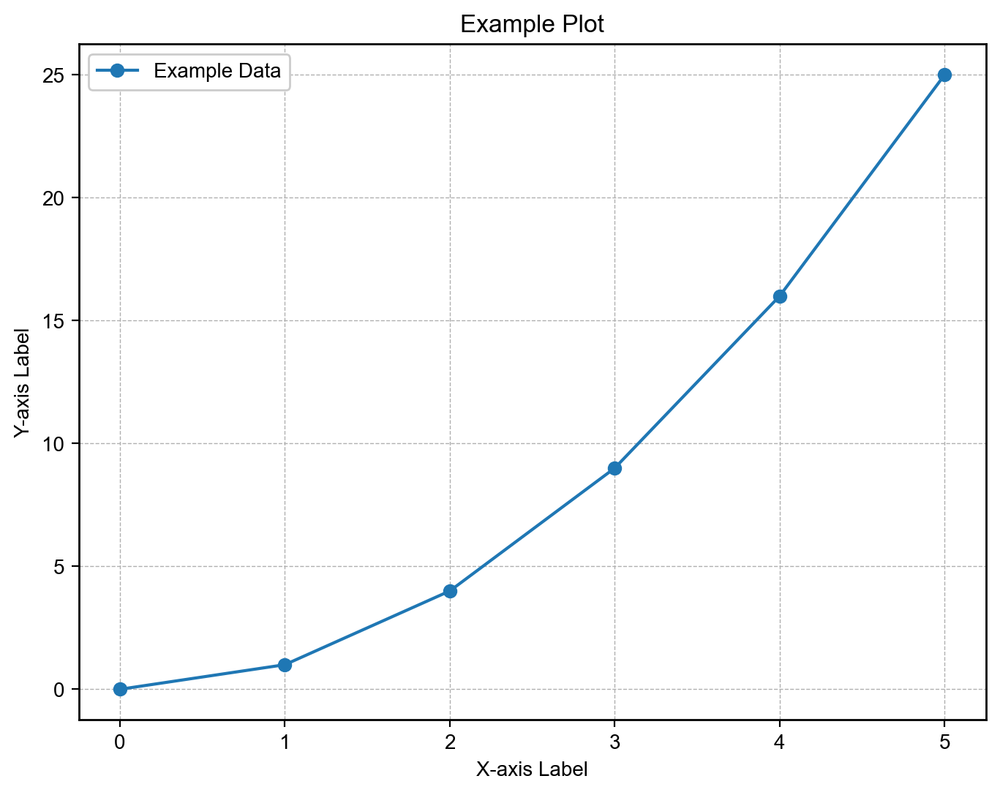

In [ ]:
import matplotlib.pyplot as plt

# Set the font size and style
plt.rcParams.update({
    'font.size': 10,
    'font.family': 'Arial',
    'axes.titlesize': 12,
    'axes.labelsize': 10,
    'xtick.labelsize': 10,
    'ytick.labelsize': 10,
    'legend.fontsize': 10,
    'figure.titlesize': 12
})

# Set the figure size
plt.rcParams['figure.figsize'] = [8,6]  # width, height in inches

# Set the line width and marker size
plt.rcParams['lines.linewidth'] = 1.5
plt.rcParams['lines.markersize'] = 6

# Set the axes properties
plt.rcParams['axes.linewidth'] = 1
plt.rcParams['axes.grid'] = True
plt.rcParams['grid.linestyle'] = '--'
plt.rcParams['grid.linewidth'] = 0.5

# Set the legend properties
plt.rcParams['legend.frameon'] = True
plt.rcParams['legend.framealpha'] = 1
plt.rcParams['legend.fancybox'] = True
plt.rcParams['legend.loc'] = 'best'

# Set the savefig properties
plt.rcParams['savefig.dpi'] = 300
plt.rcParams['savefig.format'] = 'png'
plt.rcParams['savefig.bbox'] = 'tight'

# Example plot to demonstrate the style
x = [0, 1, 2, 3, 4, 5]
y = [0, 1, 4, 9, 16, 25]
plt.plot(x, y, marker='o', label='Example Data')
plt.title('Example Plot')
plt.xlabel('X-axis Label')
plt.ylabel('Y-axis Label')
plt.legend()
plt.show()


### Make the plots

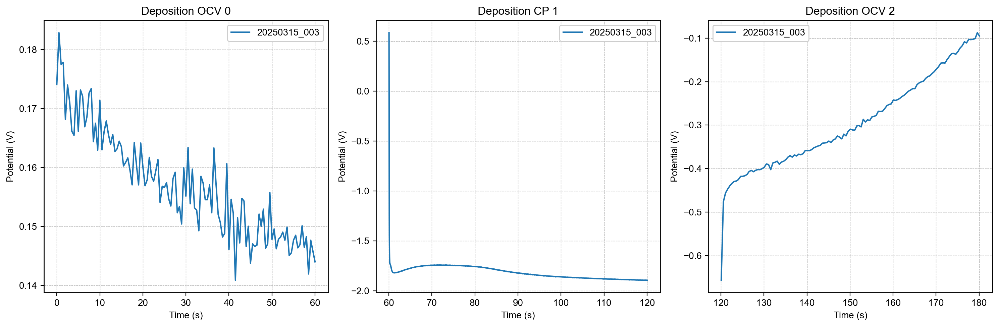

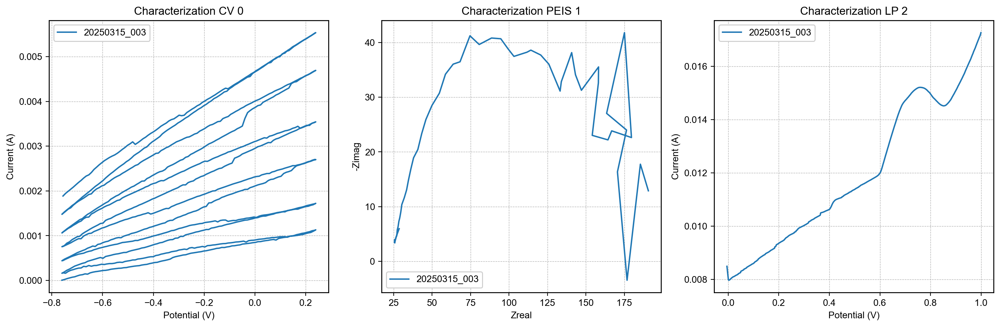

In [ ]:
# Example usage: Saving individual plots
# plot_ocv(dep_ocv0, "Deposition OCV 0", "dep_ocv0.png", deposition_fig_folder, save=False)
# plot_cp(dep_cp1, "Deposition CP 1", "dep_cp1.png", deposition_fig_folder, save=False)
# plot_ocv(dep_ocv2, "Deposition OCV 2", "dep_ocv2.png", deposition_fig_folder, save=False)

# plot_cv(chara_cv0, "Characterization CV 0", "chara_cv0.png", characterization_fig_folder, save=False)
# plot_peis(chara_peis1, "Characterization PEIS 1", "chara_peis1.png", characterization_fig_folder, save=False)
# plot_lp(chara_lp2, "Characterization LP 2", "chara_lp2.png", characterization_fig_folder, save=False)
# plot_lp(chara_lp3, "Characterization LP 3", "chara_lp3.png", characterization_fig_folder, save=False)

# Example usage: Combining Deposition & Characterization data
plot_combined_deposition(dep_ocv0, dep_cp1, dep_ocv2, "Deposition Combined", "dep_combined.png", deposition_fig_folder, save=False)
plot_combined_characterization(chara_cv0, chara_peis1, chara_lp3, "Characterization Combined", "chara_combined.png", characterization_fig_folder, save=False)

In [ ]:
# Function to combine characterization plots
def plot_combined_characterization(chara_cv0, chara_peis1, chara_cv2,chara_cv3, chara_peis4, chara_lsv5, chara_cv6, title, filename, folder, save=True, label=substrate_dict[substrate_id]):
    fig, axes = plt.subplots(3, 3, figsize=(15, 15))  # 3 plots side by side

    # CV Plot
    axes[0,0].plot(chara_cv0['Ewe_avg'], chara_cv0['I_avg'], label=label)
    axes[0,0].set_title("Characterization CV 0")
    axes[0,0].set_xlabel("Potential (V)")
    axes[0,0].set_ylabel("Current (A)")
    # axes[0,0].set_ylim(-0.0004, 0.0004)  # 👈 设置 y 轴范围

    axes[0,0].legend()

    # PEIS Plot (Nyquist)
    def impedance_convert(data):
        data['Zmodulus'] = data['Ewe'] / data['I']
        data['Zreal'] = np.cos(data['phase_Zwe']) * data['Zmodulus']
        data['Zimag'] = np.sin(data['phase_Zwe']) * data['Zmodulus']
        return data
    chara_peis1 = impedance_convert(chara_peis1)

    axes[0,1].plot(chara_peis1['Zreal'], -chara_peis1['Zimag'], label=label)
    axes[0,1].set_title("Characterization PEIS 1")
    axes[0,1].set_xlabel("Zreal")
    axes[0,1].set_ylabel("-Zimag")
    axes[0,1].legend()

    # CV Plot
    axes[0,2].plot(chara_cv2['Ewe_avg'], chara_cv2['I_avg'], label=label)
    axes[0,2].set_title("Characterization CV 2")
    axes[0,2].set_xlabel("Potential (V)")
    axes[0,2].set_ylabel("Current (A)")
    # axes[0,2].set_ylim(-0.0004, 0.0004)  # 👈 设置 y 轴范围
    axes[0,2].legend()

    # CV Plot
    axes[1,0].plot(chara_cv3['Ewe_avg'], chara_cv3['I_avg'], label=label)
    axes[1,0].set_title("Characterization CV 3")
    axes[1,0].set_xlabel("Potential (V)")
    axes[1,0].set_ylabel("Current (A)")
    # axes[1,0].set_ylim(-0.0004, 0.0004)  # 👈 设置 y 轴范围
    axes[1,0].legend()

    # PEIS Plot (Nyquist)
    def impedance_convert(data):
        data['Zmodulus'] = data['Ewe'] / data['I']
        data['Zreal'] = np.cos(data['phase_Zwe']) * data['Zmodulus']
        data['Zimag'] = np.sin(data['phase_Zwe']) * data['Zmodulus']
        return data
    chara_peis4 = impedance_convert(chara_peis4)

    axes[1,1].plot(chara_peis4['Zreal'], -chara_peis4['Zimag'], label=label)
    axes[1,1].set_title("Characterization PEIS 4")
    axes[1,1].set_xlabel("Zreal")
    axes[1,1].set_ylabel("-Zimag")
    axes[1,1].legend()
    
    # LP Plot
    axes[1,2].plot(chara_lsv5['Ewe_avg'], chara_lsv5['I_avg'], label= label)
    axes[1,2].set_title("Characterization LP 5")
    axes[1,2].set_xlabel("Potential (V)")
    axes[1,2].set_ylabel("Current (A)")
    axes[1,2].legend()

    # CV Plot
    axes[2,0].plot(chara_cv6['Ewe_avg'], chara_cv6['I_avg'], label=label)
    axes[2,0].set_title("Characterization CV 6")
    axes[2,0].set_xlabel("Potential (V)")
    axes[2,0].set_ylabel("Current (A)")
    axes[2,0].legend()

    plt.tight_layout()
    save_plot(fig, filename, folder, save)

In [ ]:
chara_cv0 = pd.read_csv(characterization_folder + '/' + chara_cv0_path[0])
chara_peis1 = pd.read_csv(characterization_folder + '/' + chara_peis1_path[0])
chara_cv2 = pd.read_csv(characterization_folder + '/' + chara_cv2_path[0])
chara_cv3 = pd.read_csv(characterization_folder + '/' + chara_cv3_path[0])
chara_peis4 = pd.read_csv(characterization_folder + '/' + chara_peis4_path[0])
chara_lsv5 = pd.read_csv(characterization_folder + '/' + chara_lsv5_path[0])
chara_cv6 = pd.read_csv(characterization_folder + '/' + chara_cv6_path[0])


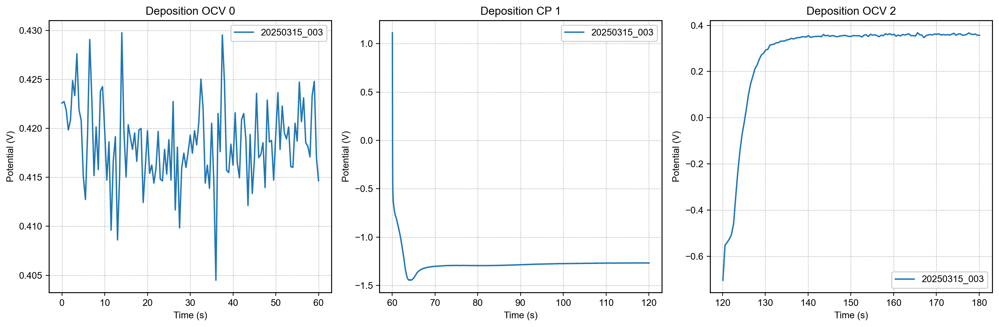

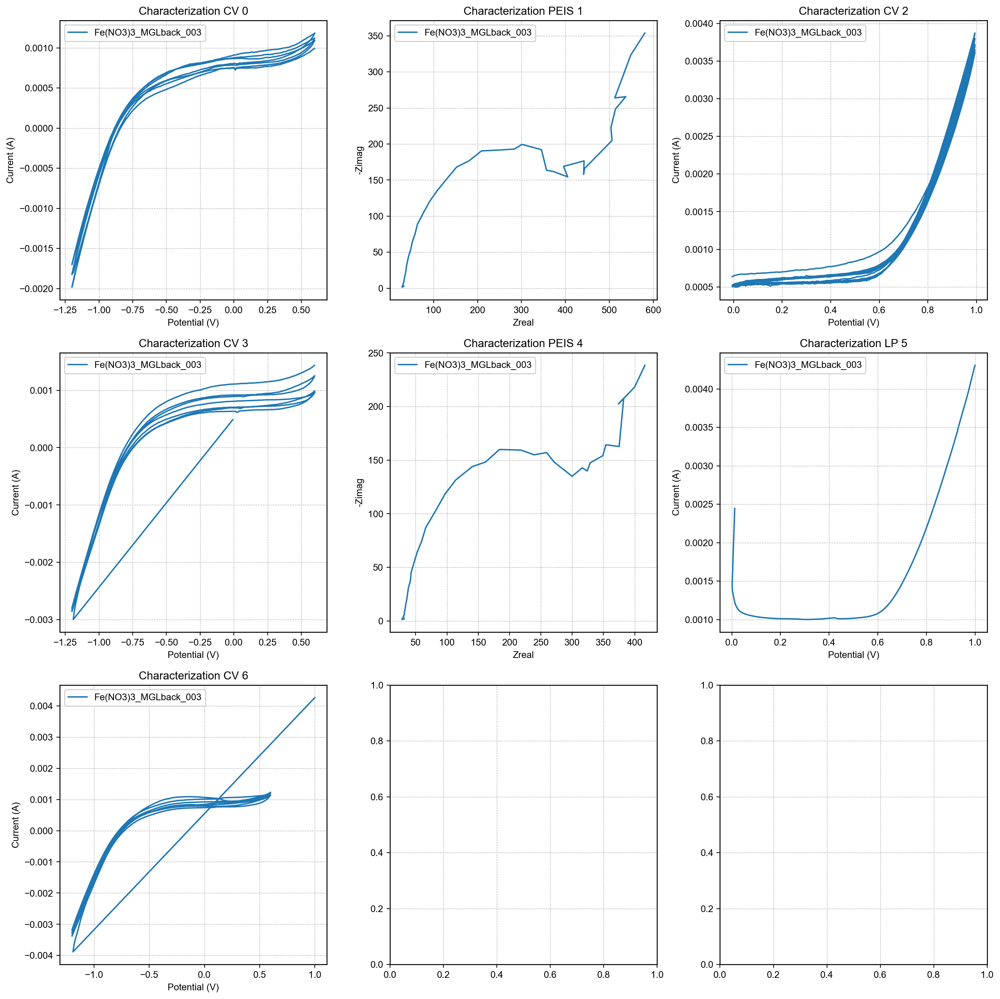

In [ ]:
plot_combined_deposition(dep_ocv0, dep_cp1, dep_ocv2, "Deposition Combined", "dep_combined.png", deposition_fig_folder, save=False)
plot_combined_characterization(chara_cv0, chara_peis1, chara_cv2,chara_cv3, chara_peis4, chara_lsv5, chara_cv6,"Characterization Combined", "chara_combined.png", characterization_fig_folder, label='Fe(NO3)3_MGLback_003',save=False)

### Functions to process data

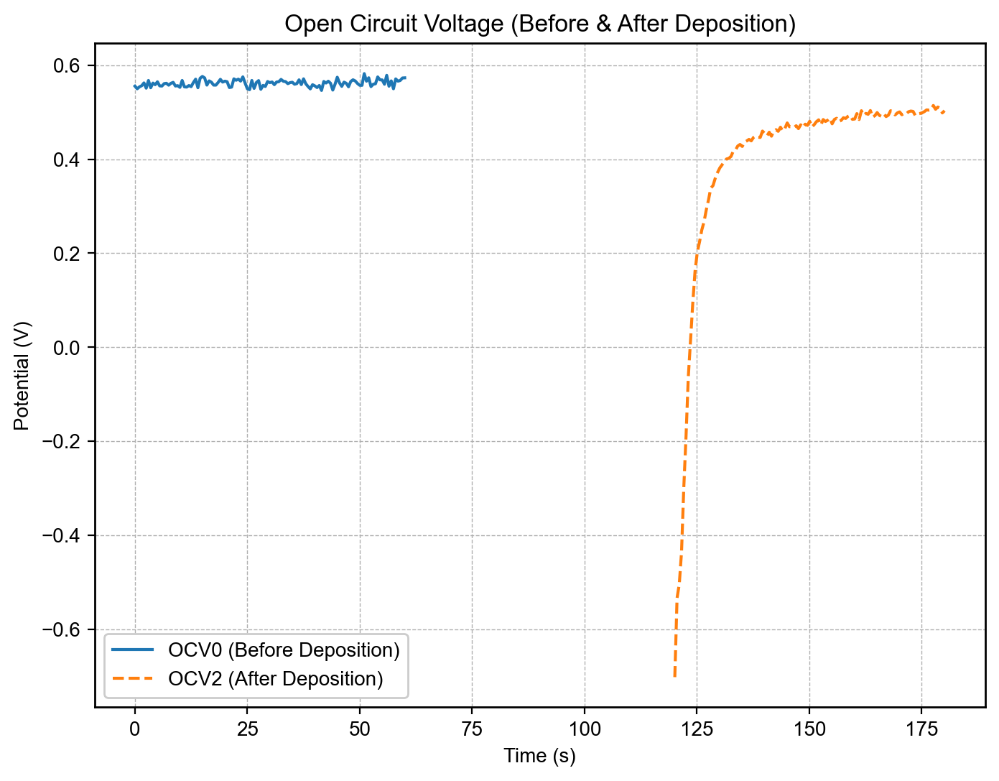

,OCV_Substrate (V),OCV_Materials (V),OCV_Difference (V)
0,0.573329,0.503296,-0.070033


In [ ]:
# process the ocv data
def process_ocv(ocv0, ocv2, plot = False, filename="processed_ocv.png", folder=deposition_fig_folder,save=False):
    ocv_initial = ocv0['Ewe'].iloc[-1]  # get the last point
    ocv_final = ocv2['Ewe'].iloc[-1]  # get the last point
    ocv_difference = ocv_final - ocv_initial
    
    ocv_results = pd.DataFrame({
        "OCV_Substrate (V)": [ocv_initial],
        "OCV_Materials (V)": [ocv_final],
        "OCV_Difference (V)": [ocv_difference]
    })

    if plot:
        fig, ax = plt.subplots()
        ax.plot(ocv0['total_time'], ocv0['Ewe'], label="OCV0 (Before Deposition)")
        ax.plot(ocv2['total_time'], ocv2['Ewe'], label="OCV2 (After Deposition)", linestyle="dashed")
        ax.set_xlabel("Time (s)")
        ax.set_ylabel("Potential (V)")
        ax.legend()
        ax.set_title("Open Circuit Voltage (Before & After Deposition)")

        save_plot(fig, filename, folder, save)  # Save if option is enabled
        plt.show()

    return ocv_results

process_ocv(dep_ocv0, dep_ocv2,plot=True)  


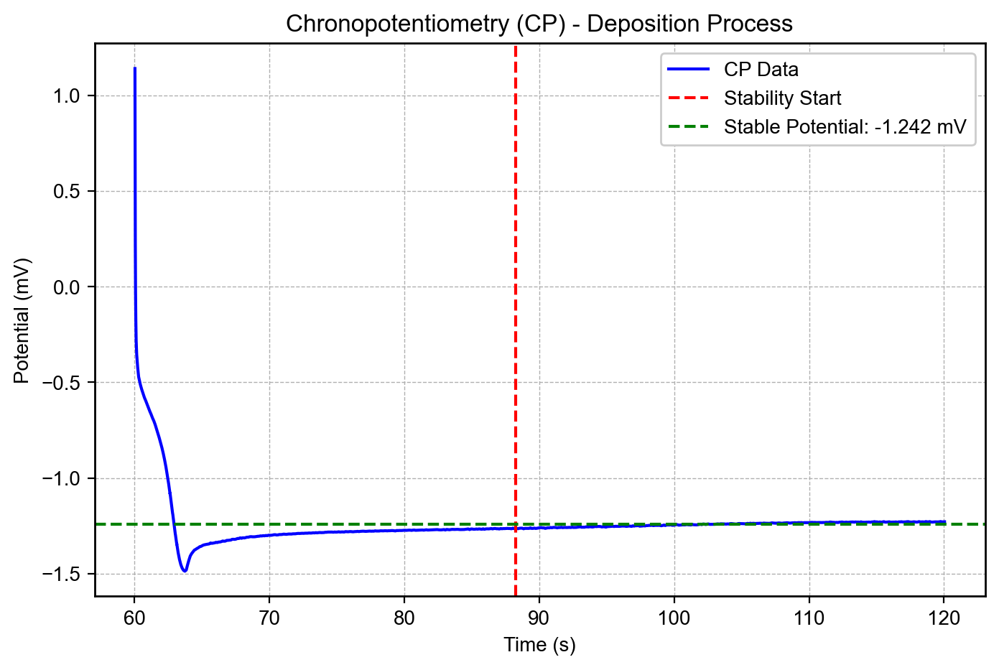

,Avg_Potential (V),Total_Charge (C),Stable_Potential (V)
0,-0.001162,-0.073629,-0.001242


In [ ]:
def process_cp(cp_data, stability_fraction=0.5, plot=False, filename="processed_cp.png", folder=deposition_fig_folder, save=False):
    """
    Processes chronopotentiometry (CP) data with optional plotting and saving.

    Parameters:
        cp_data (DataFrame): CP data with columns ['total_time', 'Ewe', 'I'].
        stability_fraction (float): Fraction of data considered stable.
        plot (bool): Whether to generate a plot.
        save (bool): Whether to save the plot.
        filename (str): Name of the file to save the plot.
        folder (str): Directory to save the plot.

    Returns:
        DataFrame: Containing average potential, total charge, and stable potential.
    """
    avg_potential = cp_data['Ewe'].mean()  # Average potential
    total_charge = cp_data['I'].sum() * (cp_data['total_time'].iloc[-1] - cp_data['total_time'].iloc[0]) / 1000       #  ∫ I dt = Q

    stability_index = int(len(cp_data) * (1 - stability_fraction))
    stable_potential = cp_data['Ewe'].iloc[stability_index:].mean()

    # Create a DataFrame for structured output
    cp_results = pd.DataFrame({
        "Avg_Potential (V)": [avg_potential/1000],
        "Total_Charge (C)": [total_charge],
        "Stable_Potential (V)": [stable_potential/1000]
    })

    if plot:
        fig, ax = plt.subplots(figsize=(8,5))
        ax.plot(cp_data['total_time'], cp_data['Ewe'], label="CP Data", color="blue")

        # Stability stage
        ax.axvline(cp_data['total_time'].iloc[stability_index], color="red", linestyle="--", label="Stability Start")
        ax.axhline(stable_potential, color="green", linestyle="--", label=f"Stable Potential: {stable_potential:.3f} mV")

        ax.set_xlabel("Time (s)")
        ax.set_ylabel("Potential (mV)")
        ax.set_title("Chronopotentiometry (CP) - Deposition Process")
        ax.legend()

        save_plot(fig, filename, folder, save)  # Save if option is enabled
        plt.show()

    return cp_results

process_cp(dep_cp1, plot=True)

In [550]:
def process_peis(peis_data, plot=False, filename="processed_peis.png", folder=characterization_fig_folder, save=False):
    """
    Process PEIS data:
    1. Convert the data to impedance modulus and phase.
    2. Extract the Rs from the Nyquist plot.
    3. Extract the Rct from the Bode plot.
    4. Generate Nyquist and Bode plots that indicate the Rs and Rct values.
    5. apply autoeis to automatedly analyze the data
    6. plot the posterior distribution, and posterior predictions
    7. record the r2 value 
    8. record the results into a dataframe
    """
    def impedance_convert(data):
        data['Zmodulus'] = data['Ewe_mod'] / data['I_mod']
        data['Zreal'] = np.cos(data['phase_Zwe']) * data['Zmodulus']
        data['Zimag'] = np.sin(data['phase_Zwe']) * data['Zmodulus']
        return data

    converted_EIS_data = impedance_convert(peis_data)
    Z = converted_EIS_data['Zreal'] - 1j * converted_EIS_data['Zimag']
    freq = converted_EIS_data['freq']
    
    # get non-Nan values
    Z_nn_idx = ~Z.isna()
    Z_nn = Z[Z_nn_idx].values

    # get the frequency values
    freq_nn_idx = ~freq.isna()
    freq_nn = freq[freq_nn_idx].values
    
    # specify the circuit to be tested
    test_circuit = 'R1-[P2,R3]'

    
    # fit the circuit
    test_parameters = ae.utils.fit_circuit_parameters(test_circuit,freq_nn,Z_nn,method='bode')

    # perform Bayesian inference
    BI_results = ae.perform_bayesian_inference(test_circuit,freq_nn,Z_nn, p0=test_parameters,num_samples=2500,method='bode')

    # visualize the posterior distributions
    posterior_mcmc = az.convert_to_inference_data(BI_results[0].mcmc)
   
    if plot or save:
        # Create figure using matplotlib context
        plt.figure(figsize=(14, 12))
    
        # Generate trace plot using ArviZ
        axes = az.plot_trace(posterior_mcmc,var_names=['R1','P2w','P2n','R3'])
        fig = plt.gcf()  # Get current figure
    
        # Save figure if required
        if save:
            fig.savefig(os.path.join(folder, 'posterior_distributions.png'),
                   bbox_inches='tight', dpi=300)
    
        # Display plot if requested
        if plot:
            plt.show()
        else:
            plt.close(fig)  

    # Obtaining MCMC samples
    samples = BI_results[0].mcmc.get_samples()
    variables = ae.parser.get_parameter_labels(test_circuit)
    
    # Extracting all parameter sets for each sample
    param_sets = np.array([[samples[v][i] for v in variables] for i in range(len(samples[variables[0]]))])
    
    # Generating the circuit function
    circuit_fn = ae.utils.generate_circuit_fn(test_circuit)
    
    # Simulating impedance data for all samples
    Zsim_list = [circuit_fn(freq_nn, params) for params in param_sets]

    # Creating the plot
    fig, ax = plt.subplots(figsize=(8, 6))

    # Plotting each simulated impedance curve from the samples with transparency for clarity
    for Zsim in Zsim_list[:200]:
        ax.plot(Zsim.real, -Zsim.imag, "-", color='grey', alpha=0.3, label='Predictions' if Zsim is Zsim_list[0] else "", marker='.', ms=15)
    
    # Plotting the measured data (ground truth) using the specified styles
    ax.plot(Z_nn.real, Z_nn.imag, '--', marker='o', color='blue', alpha=0.9, ms=8, label='Ground Truth')

    # Customizing plot appearance
    ax.set_xlabel('Re(Z) [Ohm]')
    ax.set_ylabel('-Im(Z) [Ohm]')
    ax.set_title('Nyquist Plot')
    ax.grid(True)
    ax.legend()
    if save:
        plt.savefig(os.path.join(folder,'posterior_predictions.png'), dpi=300, bbox_inches='tight')
    # Closing the figure to prevent it from showing prematurely
    plt.show()
    plt.close(fig)

    # store the parameters 
    results = pd.DataFrame({
        "Rs_mean": [np.array(posterior_mcmc.posterior['R1'].mean())],
        "Rs_std": [np.array(posterior_mcmc.posterior['R1'].std())],
        "Cdl-Q_mean": [np.array(posterior_mcmc.posterior['P2w'].mean())],
        "Cdl-Q_std": [np.array(posterior_mcmc.posterior['P2w'].std())],
        "Cdl-alpha_mean": [np.array(posterior_mcmc.posterior['P2n'].mean())],
        "Cdl-alpha_std": [np.array(posterior_mcmc.posterior['P2n'].std())],
        "Rct_mean": [np.array((posterior_mcmc.posterior['R3'].mean()))],
        "Rct_std": [np.array(posterior_mcmc.posterior['R3'].std())],
    })
    return results

# process_peis(chara_peis1, plot=True)

In [ ]:
process_peis(chara_peis1, plot=True)

In [546]:
from scipy.interpolate import interp1d
from sklearn.metrics import r2_score


def process_lsv(lsv_df, pH, R_solution=None, electrode_area=1.0, E_Ref = 1.23, plot=False, filename="processed_lp.png", folder=characterization_fig_folder, save=False):
    """
    Process LSV data:
    1. Converts potential to RHE scale.
    2. Extracts overpotential at 1, 5, 10 mA/cm².
    3. Calculates Tafel slope dynamically in the OER region.
    4. Generates LSV and Tafel plots.

    Parameters:
        lsv_df (DataFrame): LSV data with columns ["E_AgAgCl", "I_avg"].
        pH (float): pH of the electrolyte.
        electrode_area (float): Electrode geometric area (cm²).
        plot_results (bool): Whether to generate plots.

    Returns:
        dict: Overpotentials and Tafel parameters.
    """
    
    # Convert current to current density (mA/cm²)
    lsv_df["j_A_cm2"] = lsv_df["I_avg"] / electrode_area
    lsv_df["j_mA_cm2"] = lsv_df["j_A_cm2"] * 1000  # mA/cm²

    # Convert potential to RHE scale
    E_ref_AgAgCl = 0.197  # Reference potential for Ag/AgCl (1M KCl)
    lsv_df["E_RHE"] = lsv_df["Ewe_avg"] + E_ref_AgAgCl + 0.059 * pH

    # IR correction (if applicable)
    if R_solution is not None:
        lsv_df["E_RHE"] -= lsv_df["I_avg"] * R_solution 
    lsv_df["eta"] = lsv_df["E_RHE"] - E_Ref  # Overpotential (for OER)

    # Extract overpotential at specific current densities
    def get_overpotential(j_target):
        sorted_df = lsv_df
        j_values = sorted_df["j_mA_cm2"].values
        eta_values = sorted_df["eta"].values

        # find the first index that is higher than the target current density
        idx_above = np.argmax(j_values > j_target)
        idx_below = idx_above - 1

        j_below = j_values[idx_below]
        j_above = j_values[idx_above]

        eta_below = eta_values[idx_below]
        eta_above = eta_values[idx_above]

        eta_target = eta_below + (j_target - j_below) * (eta_above - eta_below) / (j_above - j_below)
        return float(eta_target)

    eta_values = {
        "op_1mA": get_overpotential(1),
        "op_5mA": get_overpotential(5),
        "op_10mA": get_overpotential(10)
    }

    # Tafel slope calculation (OER region)
    tafel_data = {
        "slope_mVdec": None,
        "j0_mA_cm2": None,
        "tafel_r2": None
    }
    tafel_region = (lsv_df["eta"].between(0.3, 0.5))

    if tafel_region.sum() < 4:  # Require minimum 4 points for fitting
        print("Insufficient data points for Tafel analysis.")
    else:
        df_tafel = lsv_df[tafel_region].copy()
        x = np.log10(df_tafel["j_mA_cm2"])
        y = df_tafel["eta"]
        
        try:
            coeffs = np.polyfit(x, y, 1)
            slope = coeffs[0] * 1000  # Convert to mV/dec
            j0 = 10**(-coeffs[1]/coeffs[0])
            r2 = r2_score(y, np.polyval(coeffs, x))
            
            tafel_data.update({
                'slope_mVdec': slope,
                'j0_mA_cm2': j0,
                'tafel_r2': r2
            })
        except Exception as e:
            print(f"Tafel analysis failed: {str(e)}")
    
    # Create a DataFrame for structured output
    results_df = pd.DataFrame({
        "pH": [pH],
        "electrode_area": [electrode_area],
        **{k: [v] for k, v in eta_values.items()},
        **{k: [v] for k, v in tafel_data.items()}
    })

    if plot:
        fig, axs = plt.subplots(1, 2, figsize=(12, 5))
        
        # LSV plot
        axs[0].plot(lsv_df["E_RHE"], lsv_df["j_mA_cm2"], 'b-')
        for j in [1, 5, 10]:
            axs[0].axhline(j, color='gray', linestyle='--', alpha=0.5)

        axs[0].set_xlabel('Potential vs RHE (V)')
        axs[0].set_ylabel('Current Density (mA/cm²)')
        axs[0].set_title('LSV Curve')
        axs[0].grid(True, which='both')
        
        # Tafel plot
        if tafel_data['slope_mVdec'] is not None:
            axs[1].plot(x, y, 'ro', label='Experimental')
            axs[1].plot(x, np.polyval(coeffs, x), 'k-', 
                        label=f'Fit: {tafel_data["slope_mVdec"]:.1f} mV/dec')
            axs[1].set_xlabel('log(j) [log(mA/cm²)]')
            axs[1].set_ylabel('Overpotential (V)')
            axs[1].set_title('Tafel Plot')
            axs[1].legend()
            axs[1].grid(True)

        plt.tight_layout()

        save_plot(fig, filename, folder, save)  # Save if option is enabled
        plt.show()
    
    
    return results_df

# process_lsv(chara_lp3, pH=13.6, R_solution=24, electrode_area=1.0, E_Ref = 1.23, plot=True)

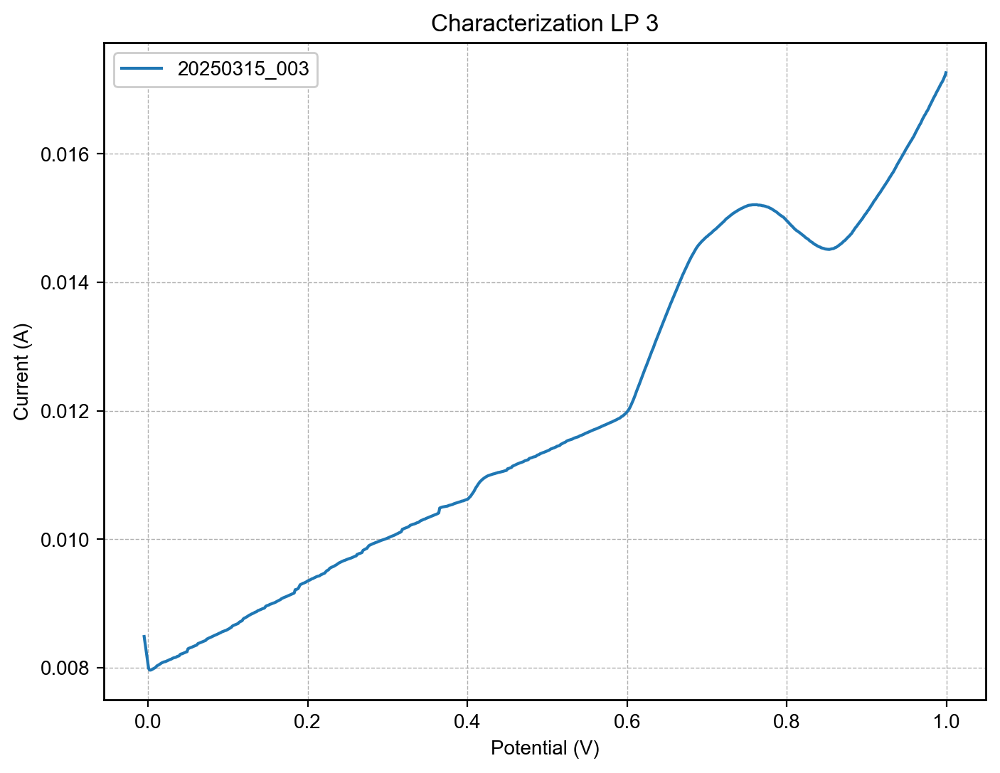

In [539]:
plot_lp(chara_lp3, "Characterization LP 3", "chara_lp3.png", characterization_fig_folder, save=False, label=substrate_dict[substrate_id])

### All-in-one analysis

In [ ]:
# now assemble all the above function into a single function

def process_all_data(substrate_path, substrate_dict, substrate_id, pH=13.6, electrode_area=1.0, E_Ref = 1.23, IR_correction = False, save=False, plot=False):
    """
    Process all data for a given substrate ID.
    """

    # create deposition and characterization figure folders
    deposition_folder = substrate_path + f"/{substrate_dict[substrate_id]}" +"/deposition"
    characterization_folder = substrate_path + f"/{substrate_dict[substrate_id]}" +"/characterization"

    # Create figure directories if they don’t exist
    deposition_fig_folder = os.path.join(deposition_folder, "figures")
    characterization_fig_folder = os.path.join(characterization_folder, "figures")

    os.makedirs(deposition_fig_folder, exist_ok=True)
    os.makedirs(characterization_fig_folder, exist_ok=True)
    
    # Load deposition data
    dep_files = os.listdir(deposition_folder)
    charc_files = os.listdir(characterization_folder)

    # Filter files based on the measurement type and ensure they end with '.mpr'
    dep_ocv0_path = [f for f in dep_files if "_0_ocv" in f and f.endswith('.csv')]
    dep_cp1_path = [f for f in dep_files if "_1_cp" in f and f.endswith('.csv')]
    dep_ocv2_path = [f for f in dep_files if "_2_ocv" in f and f.endswith('.csv')]
    chara_cv0_path = [f for f in charc_files if "_0_cv" in f and f.endswith('.csv')]
    chara_peis1_path = [f for f in charc_files if "_1_peis" in f and f.endswith('.csv')]
    chara_lp2_path = [f for f in charc_files if "_2_lp" in f and f.endswith('.csv')]
    chara_lp3_path = [f for f in charc_files if "_3_lp" in f and f.endswith('.csv')]

    # Load data
    dep_ocv0 = pd.read_csv(deposition_folder + '/' + dep_ocv0_path[0])
    dep_cp1 = pd.read_csv(deposition_folder + '/' + dep_cp1_path[0])
    dep_ocv2 = pd.read_csv(deposition_folder + '/' + dep_ocv2_path[0])
    chara_cv0 = pd.read_csv(characterization_folder + '/' + chara_cv0_path[0])
    chara_peis1 = pd.read_csv(characterization_folder + '/' + chara_peis1_path[0])
    chara_lp2 = pd.read_csv(characterization_folder + '/' + chara_lp2_path[0])
    chara_lp3 = pd.read_csv(characterization_folder + '/' + chara_lp3_path[0])
    
    # visualize the deposition data
    if plot:
        plot_combined_deposition(dep_ocv0, dep_cp1, dep_ocv2, "Deposition Combined", "dep_combined.png", substrate_path + f"/{substrate_dict[substrate_id]}", label = substrate_id, save=save)

    # visualize the characterization data
    if plot:
        plot_combined_characterization(chara_cv0, chara_peis1, chara_lp3, "Characterization Combined", "chara_combined.png", substrate_path + f"/{substrate_dict[substrate_id]}", label = substrate_id,save=save)
        
    # Process OCV data
    ocv_results = process_ocv(dep_ocv0, dep_ocv2, plot=plot, filename="processed_ocv.png", folder=substrate_path + f"/{substrate_dict[substrate_id]}" , save=save)
    
    # Process CP data
    cp_results = process_cp(dep_cp1, plot=plot, filename="processed_cp.png", folder=substrate_path + f"/{substrate_dict[substrate_id]}", save=save)

    # Process PEIS data
    peis_results = process_peis(chara_peis1, plot=plot, filename="processed_peis.png", folder=substrate_path + f"/{substrate_dict[substrate_id]}", save=save)

    # Process LSV data
    if IR_correction:
        lsv_results = process_lsv(chara_lp3, R_solution= peis_results['Rs_mean'].values[0], pH=pH, electrode_area=electrode_area, E_Ref = E_Ref, plot=plot, filename="processed_lp.png", folder=substrate_path + f"/{substrate_dict[substrate_id]}", save=save)
    else:
        lsv_results = process_lsv(chara_lp3, pH=pH, electrode_area=electrode_area, E_Ref = E_Ref, plot=plot, filename="processed_lp.png", folder=substrate_path + f"/{substrate_dict[substrate_id]}", save=save)

    # Combine all results
    results = pd.concat([ocv_results, cp_results, peis_results, lsv_results], axis=1)

    # insert sample ID
    results.insert(0, 'Sample_ID', substrate_id)

    results.to_csv(substrate_path + f"/{substrate_dict[substrate_id]}" + "/results.csv", index=False)
    
    return results



In [525]:

def updated_cv_plot(df, title, filename_out, folder_path, save=False, label="", label_by_scanrate=False, gradient_cycles=False):
    plt.figure(figsize=(8, 6))
    
    if label_by_scanrate and 'label' in df.columns:
        unique_labels = df['label'].unique()
        palette = sns.color_palette("Set2", len(unique_labels))
        color_map = dict(zip(unique_labels, palette))

        for lbl in unique_labels:
            sub_df = df[df['label'] == lbl]
            plt.plot(sub_df['Ewe_avg'], sub_df['I_avg'], label=lbl, color=color_map[lbl])
        plt.legend(title=label)
    
    elif gradient_cycles and 'cycle' in df.columns:
        cycles = df['cycle'].unique()
        colors = sns.color_palette("flare", len(cycles))
        show_labels = [cycles[0], cycles[len(cycles)//2], cycles[-1]]

        for i, cyc in enumerate(cycles):
            cyc_df = df[df['cycle'] == cyc]
            show_label = f'Cycle {cyc}' if cyc in show_labels else None
            plt.plot(cyc_df['Ewe_avg'], cyc_df['I_avg'], color=colors[i], label=show_label)
        # Show only first, middle, and last in legend
        handles, labels = plt.gca().get_legend_handles_labels()
        handles_labels = [(h, l) for h, l in zip(handles, labels) if l]
        if handles_labels:
            handles, labels = zip(*handles_labels)
            plt.legend(handles, labels,loc='best', title=label)


    else:
        plt.plot(df['Ewe_avg'], df['I_avg'], label=label)
        if label:
            plt.legend()

    plt.title(title)
    plt.xlabel('Ewe (V)')
    plt.ylabel('I (A)')
    plt.grid(True)

    if save:
        plt.savefig(os.path.join(folder_path, filename_out), dpi=300)
    if not save:
        plt.show()
    plt.close()


In [703]:

def extract_file_info(folder_path):
    """
    Extracts file metadata: filename, measurement_type, and sequential_id.
    Saves the metadata to 'file_metadata.csv'.
    """
    file_info_list = []

    pattern = re.compile(r".*_(\d+)_([a-z]+)\.csv$")

    for file_name in os.listdir(folder_path):
        match = pattern.match(file_name)
        if match:
            sequential_id = int(match.group(1))
            measurement_type = match.group(2)
            file_info_list.append({
                'file_name': file_name,
                'sequential_id': sequential_id,
                'measurement_type': measurement_type
            })

    df_info = pd.DataFrame(file_info_list)
    df_info.sort_values(by='sequential_id', inplace=True)
    df_info.to_csv(os.path.join(folder_path, "file_metadata.csv"), index=False)

    return df_info

def add_custom_labels(df_info):
    """
    Adds a 'label' column to the metadata DataFrame based on custom logic.
    """
    def assign_label(row):
        mt, sid = row['measurement_type'], row['sequential_id']
        
        # CV 1–5 → cv_20–cv_100
        if mt == 'cv' and sid in range(1, 6):
            return f'cv_{sid * 20}'
        
        # CV 11–15 → cv_20–cv_100
        if mt == 'cv' and sid in range(11, 16):
            return f'cv_{(sid - 10) * 20}'
        
        # CV 23–27 → cv_20–cv_100
        if mt == 'cv' and sid in range(23, 28):
            return f'cv_{(sid - 22) * 20}'
        
        # PEIS with known labels
        if mt == 'peis' and sid in [6, 16, 28]:
            return 'noOER'
        if mt == 'peis' and sid in [7, 17, 29]:
            return 'OER'
        
        # LSV and invalid
        if mt == 'lp' and sid == 20:
            return 'lsv'
        if mt == 'lp' and sid == 19:
            return 'invalid'
        
        # CV activity and stability
        if mt == 'cv' and sid == 21:
            return 'cv_stability'
        if mt == 'cv' and sid == 9:
            return 'cv_activation'
        
        # Default: empty label
        return ''

    df_info['label'] = df_info.apply(assign_label, axis=1)
    return df_info

def plot_all(df_info, folder_path, sample_id, save=False, plot=True, cva_last_cycle_only=True):
    # ---- Group CVA blocks ----
    cva_groups = [
        {'seq_ids': list(range(1, 6)), 'label_prefix': 'CVA_0'},
        {'seq_ids': list(range(11, 16)), 'label_prefix': 'CVA_1'},
        {'seq_ids': list(range(23, 28)), 'label_prefix': 'CVA_2'},
    ]
    
    for i, group in enumerate(cva_groups):
        dfs = []
        for sid in group['seq_ids']:
            fname = df_info[(df_info['measurement_type'] == 'cv') & 
                            (df_info['sequential_id'] == sid)]['file_name'].values
            if len(fname) == 0:
                continue
            df = pd.read_csv(os.path.join(folder_path, fname[0]))
            dfs.append(df)
        
        if dfs:
            if cva_last_cycle_only:
                last_cycle_dfs = []
                labels = []

                for sid in group['seq_ids']:
                    fname = df_info[(df_info['measurement_type'] == 'cv') & 
                                    (df_info['sequential_id'] == sid)]['file_name'].values
                    if len(fname) == 0:
                        continue
                    df_full = pd.read_csv(os.path.join(folder_path, fname[0]))

                    if 'cycle' not in df_full.columns:
                        print(f"⚠️ 'cycle' column not found in {fname[0]}. Skipping.")
                        continue

                    last_cycle_num = df_full['cycle'].max()
                    df_last = df_full[df_full['cycle'] == last_cycle_num]
                    last_cycle_dfs.append(df_last)
                    labels.append(df_info[df_info['sequential_id'] == sid]['label'].values[0])

                if last_cycle_dfs:
                    df_concat = pd.concat(last_cycle_dfs)
                    title = f"CVA_{i}"
                    filename_out = f"{title}.png"
                    df_concat['label'] = [lbl for lbl, df in zip(labels, last_cycle_dfs) for _ in range(len(df))]
                    updated_cv_plot(df_concat, title, filename_out, folder_path, save=save, label=sample_id, label_by_scanrate=True)
            else:
                df_concat = pd.concat(dfs)
                title = f"CVA_{i}"
                filename_out = f"{title}.png"
                df_concat['label'] = [df_info[df_info['sequential_id'] == sid]['label'].values[0] for sid in group['seq_ids'] for _ in range(len(pd.read_csv(os.path.join(folder_path, df_info[df_info['sequential_id'] == sid]['file_name'].values[0]))))]
                updated_cv_plot(df_concat, title, filename_out, folder_path, save=save, label=sample_id, label_by_scanrate=True)

            

    # ---- Loop over remaining entries ----
    special_cv_titles = {
        'cv_activation': 'CV Activation',
        'cv_stability': 'CV Stability',
    }

    cv_redox_counter = 0
    ocv_counter = 0
    peis_oer_counter = 0
    peis_nooer_counter = 0

    for _, row in df_info.iterrows():
        file_path = os.path.join(folder_path, row['file_name'])
        mt = row['measurement_type']
        label = row['label']
        sid = row['sequential_id']
        df = pd.read_csv(file_path)

        # Skip files already used in CVA
        if mt == 'cv' and sid in list(range(1, 6)) + list(range(11, 16)) + list(range(23, 28)):
            continue

        # Determine title
        if mt == 'peis' and label == 'OER':
            title = f"PEIS_OER_{peis_oer_counter}"
            peis_oer_counter += 1
        elif mt == 'peis' and label == 'noOER':
            title = f"PEIS_noOER_{peis_nooer_counter}"
            peis_nooer_counter += 1
        elif mt == 'ocv':
            title = f"OCV_{ocv_counter}"
            ocv_counter += 1
        elif mt == 'cv' and label in special_cv_titles:
            title = special_cv_titles[label]
        elif mt == 'cv':
            title = f"CV Redox {cv_redox_counter}"
            cv_redox_counter += 1
        elif mt == 'lp' and label == 'lsv':
            title = "LSV"
        elif mt == 'lp' and label == 'invalid':
            title = "Invalid LSV"
        else:
            title = f"{mt.upper()} Measurement - ID {sid}"

        filename_out = f"{title.replace(' ', '_')}.png"

        # Dispatch plotting
        if mt == "cv":
            # plot_cv(df.iloc[1:], title, filename_out, folder_path, save=save, label=sample_id)
            if label in ['cv_activation', 'cv_stability']:
                # df['cycle'] = assign_cycles(df)  # You’ll need to implement this
                updated_cv_plot(df.iloc[1:], title, filename_out, folder_path, save=save, label=sample_id, gradient_cycles=True)
            else:
                updated_cv_plot(df.iloc[1:], title, filename_out, folder_path, save=save, label=sample_id)

        elif mt == "ocv":
            plot_ocv(df.iloc[1:], title, filename_out, folder_path, save=save, label=sample_id)
        elif mt == "peis":
            plot_peis(df, title, filename_out, folder_path, save=save, label=sample_id)
        elif mt == "cp":
            plot_cp(df, title, filename_out, folder_path, save=save, label=sample_id)
        elif mt == "lp":
            if sid == 20:
                plot_lp(df.iloc[1:], title, filename_out, folder_path, save=save, label=sample_id)
        else:
            print(f"⚠️ No plotting function defined for: {mt}")

### Analysis

In [ ]:
# input board

# set sample batch
# substrate_path = "/home/runzezhang/Data/OT2/20250311_substrate test"
# substrate_dict = {
#     "590937_back1": "20250311_000", "590937_back2": "20250311_001", "590937_back3": "20250311_002",
#     "625303_back1": "20250311_003", "625303_back2": "20250311_004", "625303_back3": "20250311_005",
#     "625303_front1": "20250311_006", "625303_front2": "20250311_007", "625303_front3": "20250311_008",
#     "592057_back1": "20250311_009", "592057_back2": "20250311_010", "592057_back3": "20250311_011",
#     "592507_front1": "20250311_012", "592507_front2": "20250311_013", "592507_front3": "20250311_014"
# }
# substrate_id = "625303_front3"

# set sample batch
substrate_path = "/home/runzezhang/Data/OT2/20250314_substrate test"
substrate_dict = {
    "MGL_front1": "20250312_000", "MGL_front2": "20250313_001", "MGL_front3": "20250314_002",
    "MGL_back1": "20250314_003", "MGL_back2": "20250314_004", "MGL_back3": "20250314_005",
    "398b_front1": "20250314_006", "398b_front2": "20250314_007", "398b_front3": "20250314_008",
    "398b_back1": "20250314_009", "398b_back2": "20250314_010", "398b_back3": "20250314_011",
    "590937_front1": "20250314_012", "590937_front2": "20250314_013", "590937_front3": "20250314_014"
}
substrate_id = "MGL_back3"


# set sample batch
# substrate_path = "/home/runzezhang/Data/OT2/20250315_substrate test"
# substrate_dict = {
#     "MGL_front4": "20250315_000", "MGL_front5": "20250315_001", "MGL_front6": "20250315_002",
#     "MGL190_1": "20250315_003", "MGL190_2": "20250315_004", "MGL190_3": "20250315_005",
#     "Hydrophilic_light_1": "20250315_006", "Hydrophilic_light_2": "20250315_007", "Hydrophilic_light_3": "20250315_008",
#     "Hydrophilic_dark_1": "20250315_009", "Hydrophilic_dark_2": "20250315_010", "Hydrophilic_dark_3": "20250315_011"
# }
# substrate_id = "Hydrophilic_dark_3"

# set process parameters: pH, electrode_area, E_Ref, IR_correction, save, plot
pH = 13.6
electrode_area = 1.0
E_Ref = 1.23
IR_correction = True
save = True
plot = True

Refining Initial Guess:   0%|          | 0/1 [00:00<?, ?it/s]

Running Bayesian Inference:   0%|          | 0/1 [00:00<?, ?it/s]

<Figure size 1400x1200 with 0 Axes>

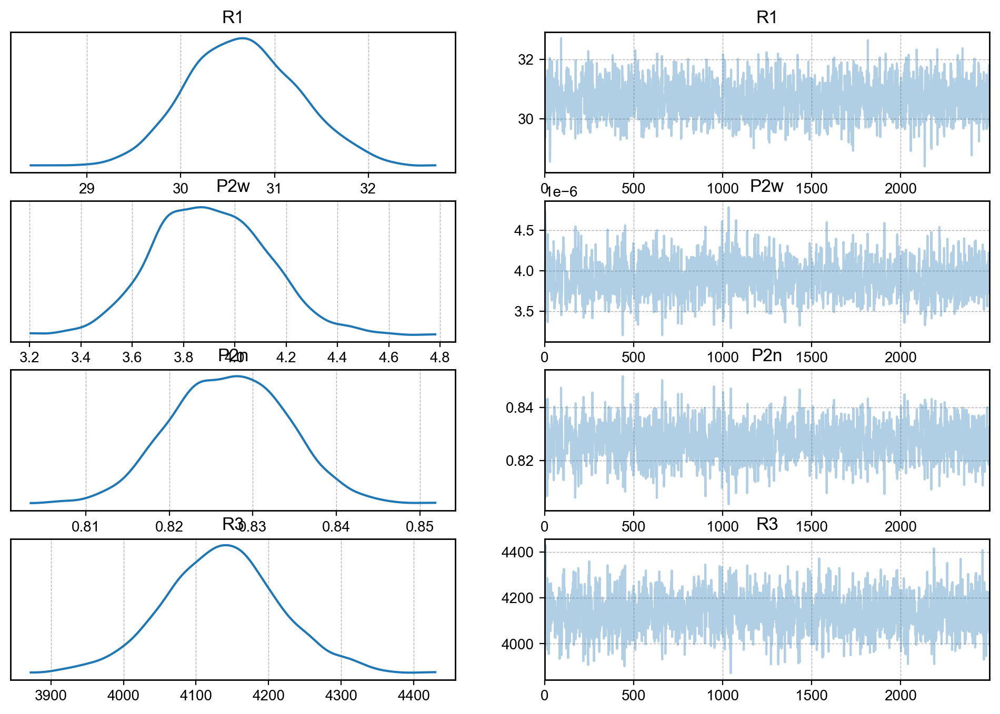

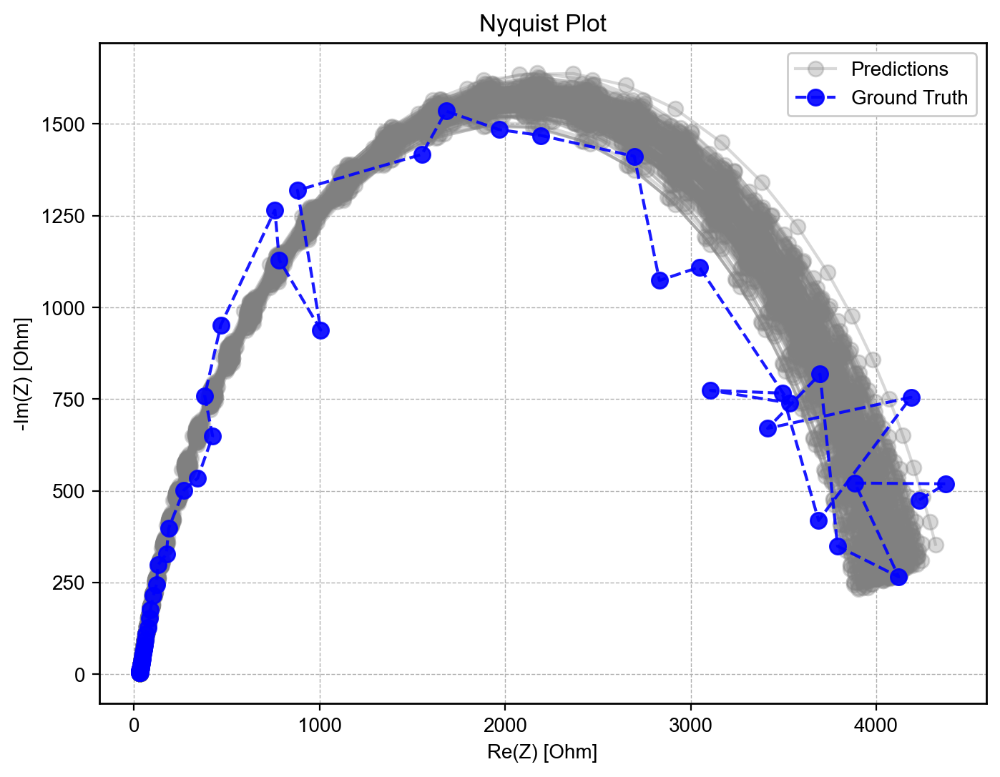

In [ ]:
results = process_all_data(substrate_path, substrate_dict, substrate_id, pH, electrode_area, E_Ref, IR_correction, save, plot)

In [ ]:
results

,Sample_ID,OCV_Substrate (V),OCV_Materials (V),OCV_Difference (V),Avg_Potential (V),Total_Charge (C),Stable_Potential (V),Rs_mean,Rs_std,Cdl-Q_mean,...,Rct_mean,Rct_std,pH,electrode_area,op_1mA,op_5mA,op_10mA,slope_mVdec,j0_mA_cm2,tafel_r2
0,592057_back1,0.088696,-0.08155,-0.170246,-0.002073,-0.073067,-0.002218,24.304579863393226,1.2421229777604408,0.00010610171444755188,...,34020.9599090049,618765.1947893356,13.6,1.0,0.115551,0.348061,0.402703,174.401372,0.047706,0.976807


### Combine analysis results into one file

In [ ]:
# load each result in each batch and combine them into a single dataframe
import os
import pandas as pd

# set sample batch
substrate_path = "/home/runzezhang/Data/OT2/20250315_substrate test"
substrate_dict = {
    "MGL_front4": "20250315_000", "MGL_front5": "20250315_001", "MGL_front6": "20250315_002",
    "MGL190_1": "20250315_003", "MGL190_2": "20250315_004", "MGL190_3": "20250315_005",
    "Hydrophilic_light_1": "20250315_006", "Hydrophilic_light_2": "20250315_007", "Hydrophilic_light_3": "20250315_008",
    "Hydrophilic_dark_1": "20250315_009", "Hydrophilic_dark_2": "20250315_010", "Hydrophilic_dark_3": "20250315_011"
}
# load all the results
results = []
for substrate_id in substrate_dict.keys():
    result_path = substrate_path + f"/{substrate_dict[substrate_id]}" + "/results.csv"
    result = pd.read_csv(result_path)
    results.append(result)


In [ ]:
# batch2 = pd.concat(results)
# batch3 = pd.concat(results)
# batch4 = pd.concat(results)

all_results = pd.concat([batch2, batch3, batch4])
all_results.head()

,Sample_ID,OCV_Substrate (V),OCV_Materials (V),OCV_Difference (V),Avg_Potential (V),Total_Charge (C),Stable_Potential (V),Rs_mean,Rs_std,Cdl-Q_mean,...,Rct_mean,Rct_std,pH,electrode_area,op_1mA,op_5mA,op_10mA,slope_mVdec,j0_mA_cm2,tafel_r2
0,590937_back1,0.136056,-0.096011,-0.232067,-0.002250,-0.073039,-0.002411,21.035366,0.874548,0.000035,...,1500.189049,45.589471,13.6,1.0,0.239854,0.364350,0.428420,186.867655,0.052093,0.986045
0,590937_back2,0.112124,-0.108953,-0.221077,-0.002336,-0.073762,-0.002510,23.342294,1.103172,0.000030,...,1692.202412,45.840631,13.6,1.0,0.244574,0.335447,0.383451,170.763259,0.053621,0.981959
0,590937_back3,0.132376,-0.092085,-0.224460,-0.002330,-0.073684,-0.002480,24.659456,0.608776,0.000031,...,2057.796001,47.781812,13.6,1.0,0.233798,0.350628,0.396399,149.922433,0.021714,0.989214
0,625303_back1,0.188504,-0.096921,-0.285424,-0.001897,-0.072472,-0.002058,27.952423,0.850239,0.000003,...,4931.659154,88.369551,13.6,1.0,0.422680,2.105125,4.427991,427.401438,0.099080,0.988225
0,625303_back2,0.137027,-0.099985,-0.237012,-0.002199,-0.073124,-0.002364,27.235886,0.893092,0.000004,...,3452.313422,62.527853,13.6,1.0,0.357813,1.561171,3.329885,433.694552,0.147146,0.991265


In [ ]:
all_results.to_csv("/home/runzezhang/Data/OT2/0311_0315.csv", index=False)

### Visualize the resutls

In [ ]:
# remove outliers
outliers = ["MGL_front1"]
results_clean = all_results[~all_results['Sample_ID'].isin(outliers)]

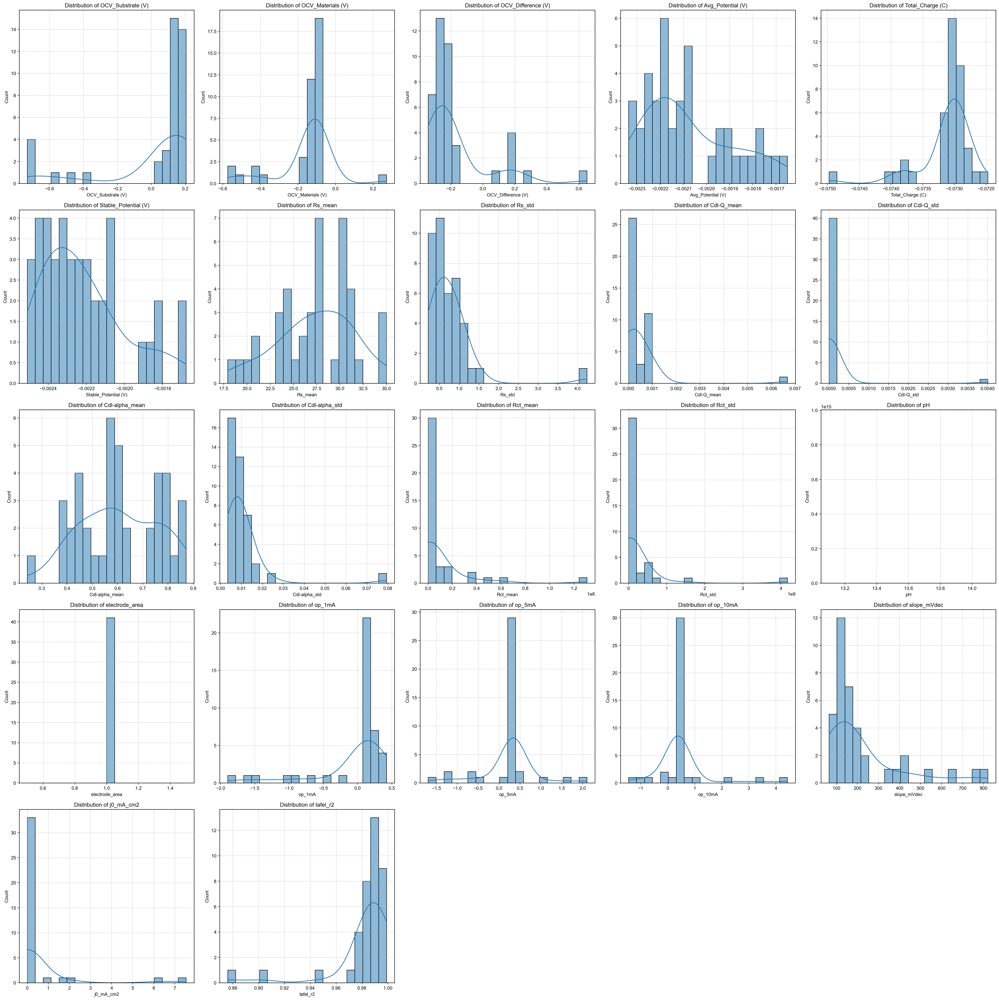

In [ ]:
num_features = results_clean.select_dtypes(include=[np.number]).columns

plt.figure(figsize=(30, 30))
for i, col in enumerate(num_features, 1):
    plt.subplot(5, 5, i)
    sns.histplot(results_clean[col], bins=20, kde=True)
    plt.title(f'Distribution of {col}')
plt.tight_layout()
plt.show()


In [ ]:
all_results[all_results['Sample_ID'].str.contains("MGL_back", na=False)][['Sample_ID', 'Rs_mean', 'Rct_mean', 'Cdl-Q_mean', 'Cdl-alpha_mean', 'op_10mA','slope_mVdec']]

,Sample_ID,Rs_mean,Rct_mean,Cdl-Q_mean,Cdl-alpha_mean,op_10mA,slope_mVdec
0,MGL_back1,34.962170,3326.873928,0.000001,0.871591,0.339196,104.363258
0,MGL_back2,31.395493,3374.283971,0.000003,0.870550,0.367566,118.121565
0,MGL_back3,30.671713,4130.933333,0.000004,0.827385,0.381746,130.537368


In [ ]:
import re
results_clean["Sample_Group"] = results_clean["Sample_ID"].apply(lambda x: x[:-1])

def plot_feature_variation(feature, plot_type='bar'):
    """可视化特征在不同样本组的均值和标准差
    
    Parameters:
    feature (str)   : 需要可视化的特征列名
    plot_type (str) : 图表类型，'bar' 或 'scatter'（默认条形图）
    """
    # 计算均值和标准差（按均值升序排序）
    grouped = results_clean.groupby("Sample_Group")[feature].agg(["mean", "std"])
    grouped = grouped.sort_values("mean", ascending=False)  # 默认降序显示
    
    # 共用设置
    plt.figure(figsize=(12, 6))
    plt.title(f"Variation of {feature} across Sample Groups", fontsize=14)
    plt.xticks(rotation=45, ha='right')
    plt.ylabel(feature)

    if plot_type == 'bar':
        # 条形图模式（带标准差误差条）
        ax = sns.barplot(
            x=grouped.index,
            y="mean",
            data=grouped.reset_index(),
            palette="viridis",
            order=grouped.index  # 强制使用排序后的顺序
        )
        
        # 手动添加误差条（使用提供的std列）
        for i, (_, row) in enumerate(grouped.iterrows()):
            plt.errorbar(
                x=i,
                y=row['mean'],
                yerr=row['std'],
                fmt='none',
                ecolor='black',
                elinewidth=1.5,
                capsize=4
            )

        # 添加均值标签
        for i, p in enumerate(ax.patches):
            mean_val = p.get_height()
            std_val = grouped.iloc[i]["std"]  # 通过序号索引获取对应标准差
            ax.annotate(
                f"{mean_val:.2f}\n(±{std_val:.3f})",
                (p.get_x() + p.get_width()/2., mean_val*1.05),
                ha='center', va='center',
                xytext=(0, 10),
                textcoords='offset points',
                fontsize=8
            )

    elif plot_type == 'scatter':
        # 散点图模式（点大小表示标准差）
        scatter = plt.scatter(
            x=grouped.index,
            y=grouped["mean"],
            c=grouped["mean"],
            s=grouped["std"]*700 + 50,  # 尺寸标准化（避免过小）
            cmap="coolwarm",
            alpha=0.8,
            edgecolors="k",
            linewidths=0.5
        )
        plt.colorbar(scatter, label=f'{feature} Mean Value')

        # 添加标准差图例
        for std in [grouped['std'].quantile(0.2), grouped['std'].median(), grouped['std'].quantile(0.8)]:
            plt.scatter([], [], c='gray', alpha=0.5, s=std*700+50,
                        label=f'Std ≈ {std:.3f}')
        plt.legend(title="Standard Deviation", loc='upper right')

    plt.tight_layout()
    plt.show()


/tmp/ipykernel_865524/1182810171.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  results_clean["Sample_Group"] = results_clean["Sample_ID"].apply(lambda x: x[:-1])


In [ ]:
results_clean.columns

Index(['Sample_ID', 'OCV_Substrate (V)', 'OCV_Materials (V)',
       'OCV_Difference (V)', 'Avg_Potential (V)', 'Total_Charge (C)',
       'Stable_Potential (V)', 'Rs_mean', 'Rs_std', 'Cdl-Q_mean', 'Cdl-Q_std',
       'Cdl-alpha_mean', 'Cdl-alpha_std', 'Rct_mean', 'Rct_std', 'pH',
       'electrode_area', 'op_1mA', 'op_5mA', 'op_10mA', 'slope_mVdec',
       'j0_mA_cm2', 'tafel_r2', 'Sample_Group'],
      dtype='object')

/tmp/ipykernel_865524/4102502254.py:23: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(


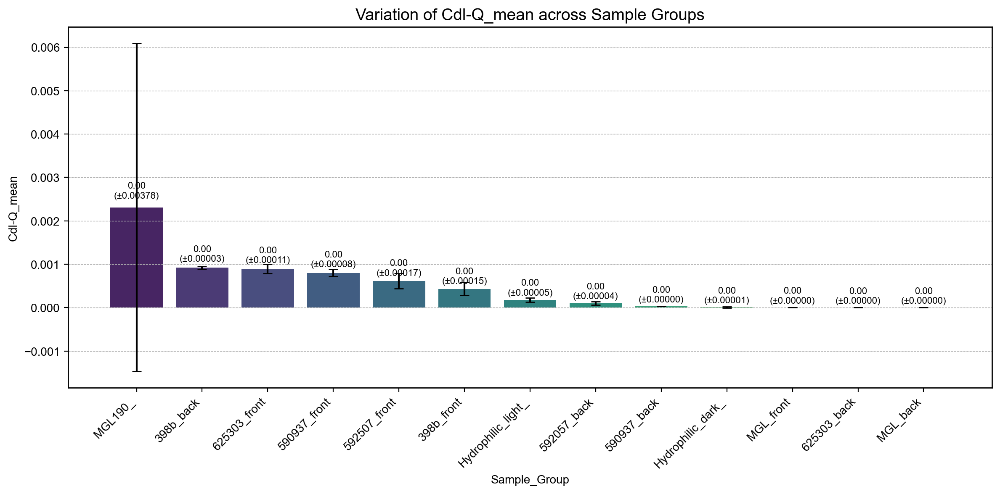

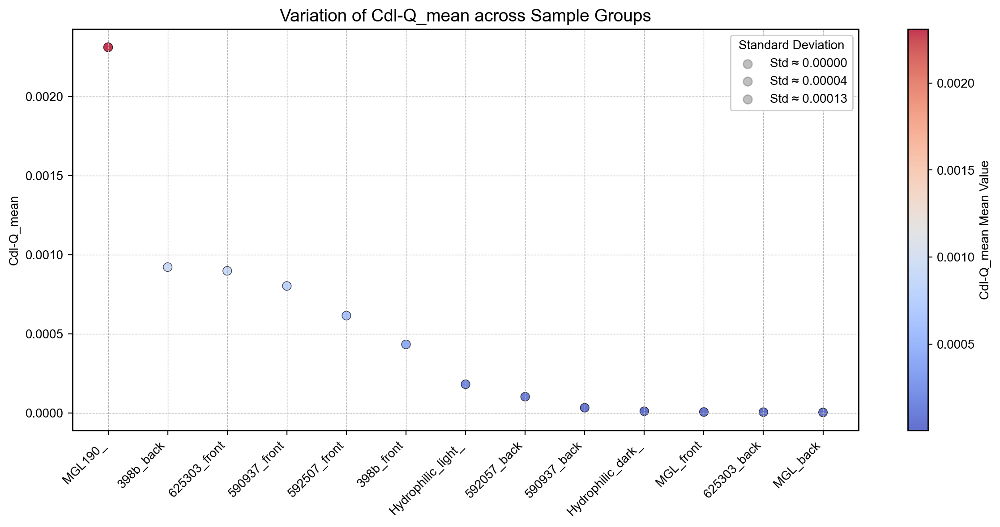

In [ ]:
plot_feature_variation("Cdl-Q_mean", plot_type='bar')
plot_feature_variation("Cdl-Q_mean", plot_type='scatter')


#### Track voltage change

[!] Skipped 20250401_010_19_lp.csv: missing columns


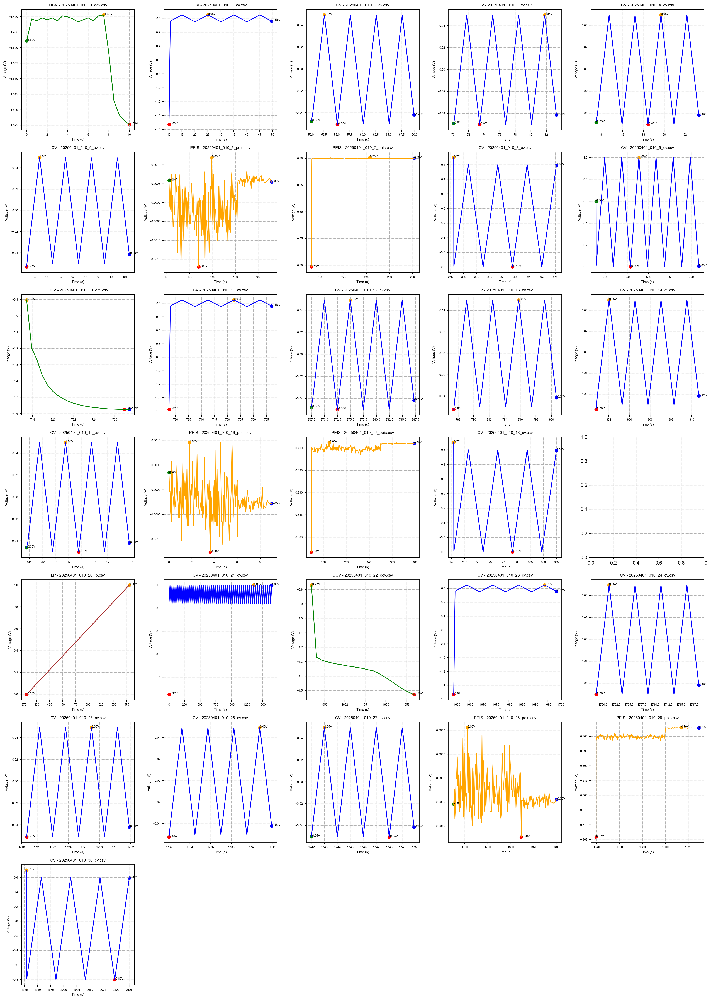

In [ ]:
import os
import pandas as pd
import matplotlib.pyplot as plt
import re

# Setup
# characterization_folder = './your_folder'  # <- change this to your folder
tech_pattern = re.compile(r'_(ocv|cv|cva|peis|lsv|lp)\.csv$', re.IGNORECASE)

# Color mapping by technique
tech_colors = {
    'ocv': 'green',
    'cv': 'blue',
    'cva': 'purple',
    'peis': 'orange',
    'lsv': 'red',
    'lp': 'brown'
}

# Sort files by modified time
files = sorted(
    [f for f in os.listdir(characterization_folder) if f.endswith('.csv')],
    key=lambda x: os.path.getmtime(os.path.join(characterization_folder, x))
)

# Create subplots: 5 columns, 7 rows (max 35 files)
fig, axes = plt.subplots(nrows=7, ncols=5, figsize=(20, 28))
axes = axes.flatten()

for idx, filename in enumerate(files[:35]):  # Limit to 35
    match = tech_pattern.search(filename)
    if not match:
        print(f"[!] Skipped {filename}: no recognizable technique")
        continue

    technique = match.group(1).lower()
    filepath = os.path.join(characterization_folder, filename)

    try:
        df = pd.read_csv(filepath)

        # Select column names
        time_col = 'total_time'
        voltage_col = 'Ewe' if technique in ['ocv', 'peis'] else 'Ewe_avg'

        if time_col in df.columns and voltage_col in df.columns:
            ax = axes[idx]
            time = df[time_col]
            voltage = df[voltage_col]

            # Plot line
            ax.plot(time, voltage, label='Voltage', color=tech_colors.get(technique, 'black'))

            # Annotate start, end, min, max
            ax.scatter(time.iloc[0], voltage.iloc[0], color='green', label='Start')
            ax.scatter(time.iloc[-1], voltage.iloc[-1], color='blue', label='End')
            ax.scatter(time[voltage.idxmin()], voltage.min(), color='red', label='Min V')
            ax.scatter(time[voltage.idxmax()], voltage.max(), color='orange', label='Max V')

            # Add text labels
            ax.text(time.iloc[0], voltage.iloc[0], f'{voltage.iloc[0]:.2f}V', fontsize=6)
            ax.text(time.iloc[-1], voltage.iloc[-1], f'{voltage.iloc[-1]:.2f}V', fontsize=6)
            ax.text(time[voltage.idxmin()], voltage.min(), f'{voltage.min():.2f}V', fontsize=6)
            ax.text(time[voltage.idxmax()], voltage.max(), f'{voltage.max():.2f}V', fontsize=6)

            ax.set_title(f'{technique.upper()} - {filename}', fontsize=8)
            ax.set_xlabel('Time (s)', fontsize=7)
            ax.set_ylabel('Voltage (V)', fontsize=7)
            ax.grid(True)
            ax.tick_params(labelsize=6)
        else:
            print(f"[!] Skipped {filename}: missing columns")

    except Exception as e:
        print(f"[!] Error processing {filename}: {e}")

# Hide unused subplots
for j in range(idx + 1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()


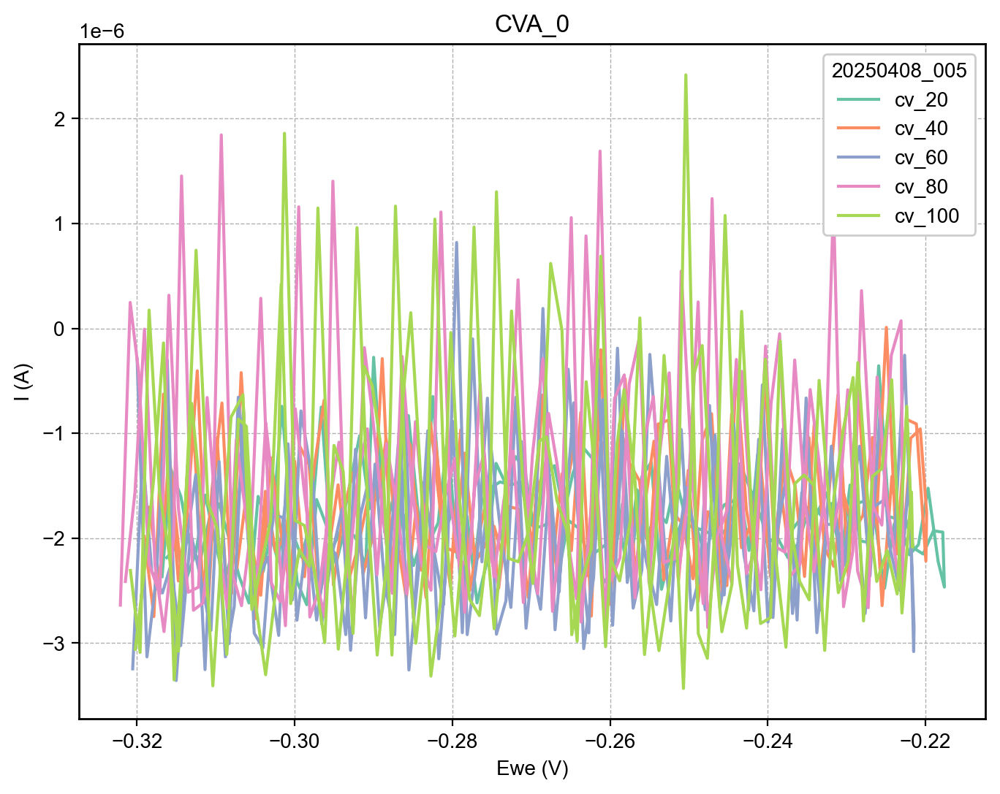

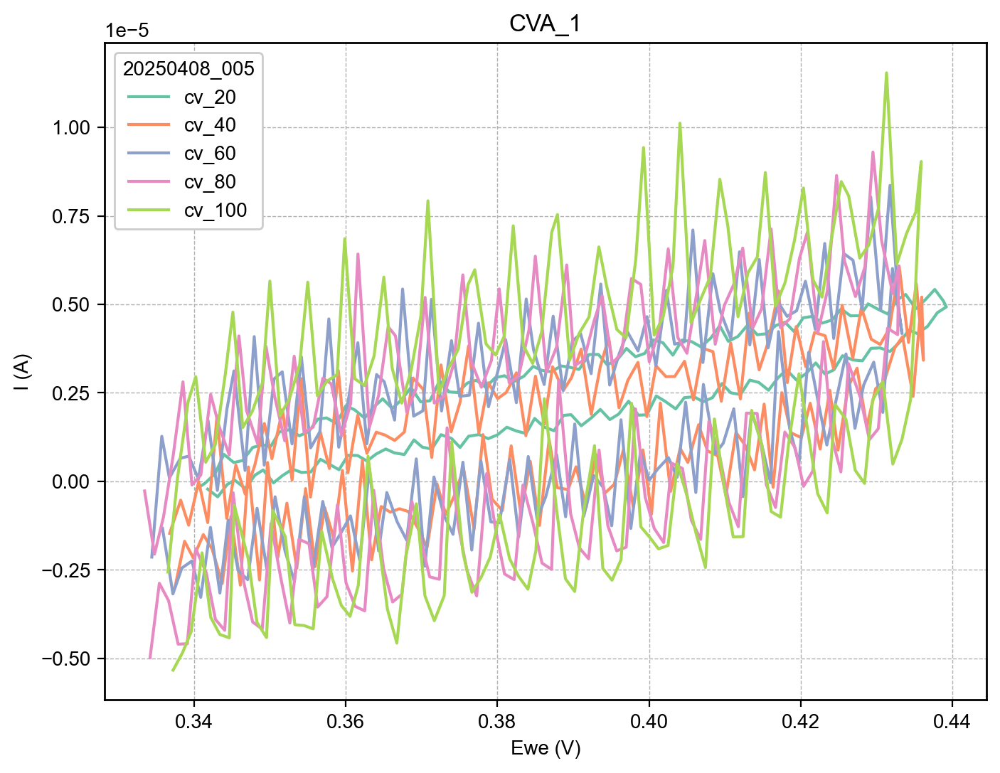

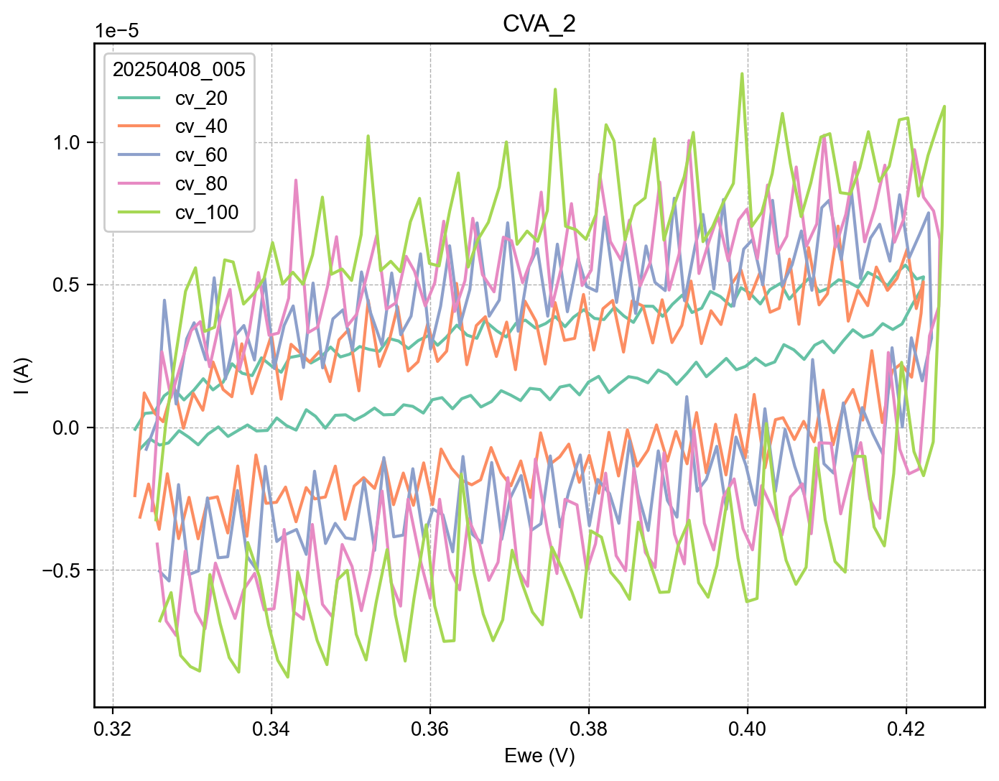

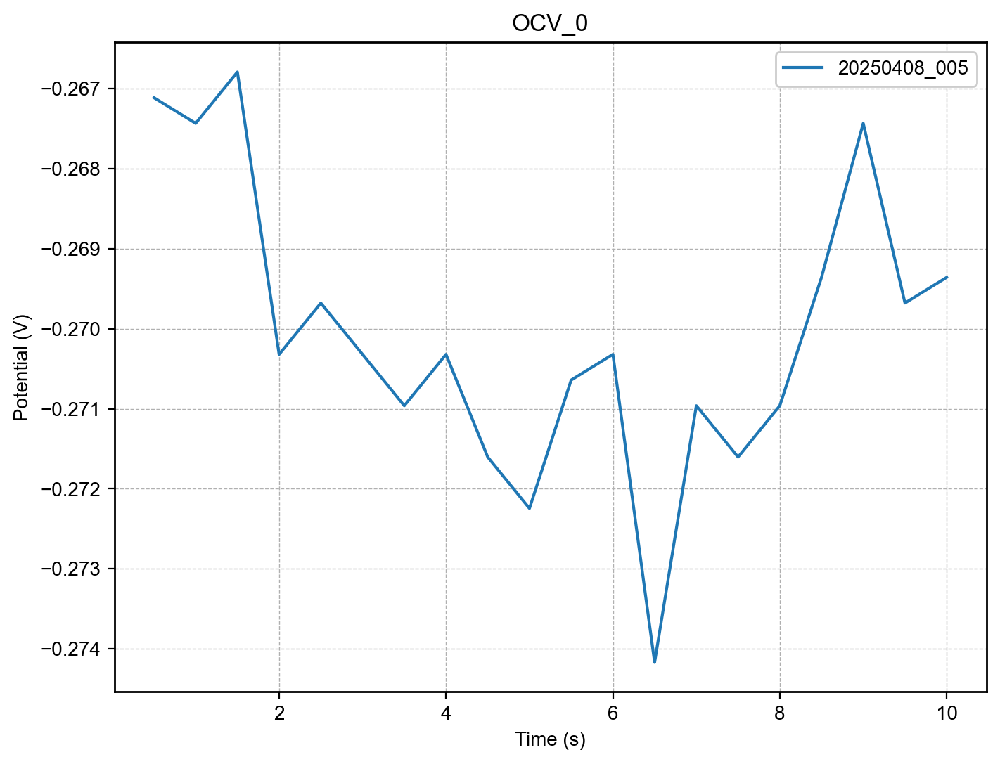

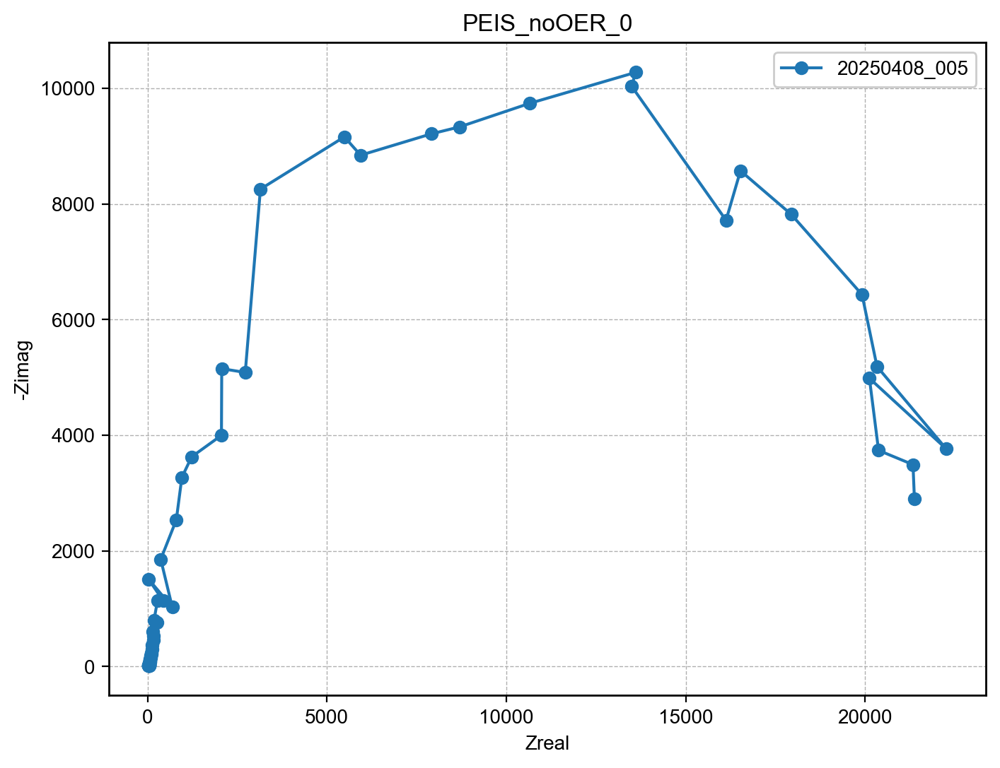

...

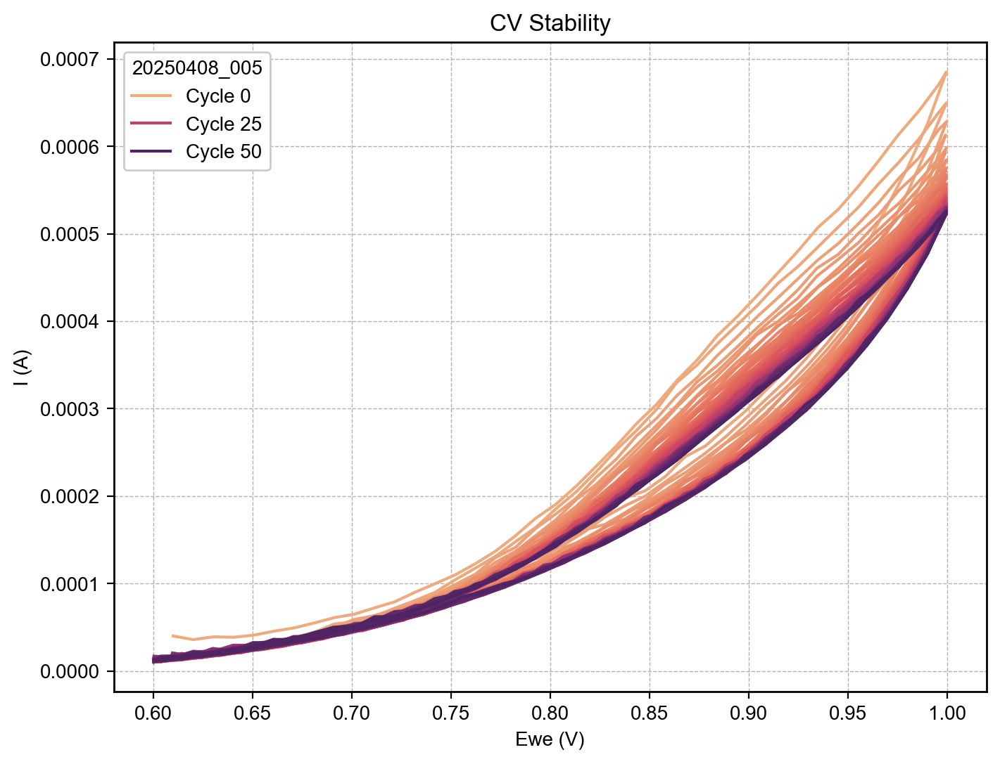

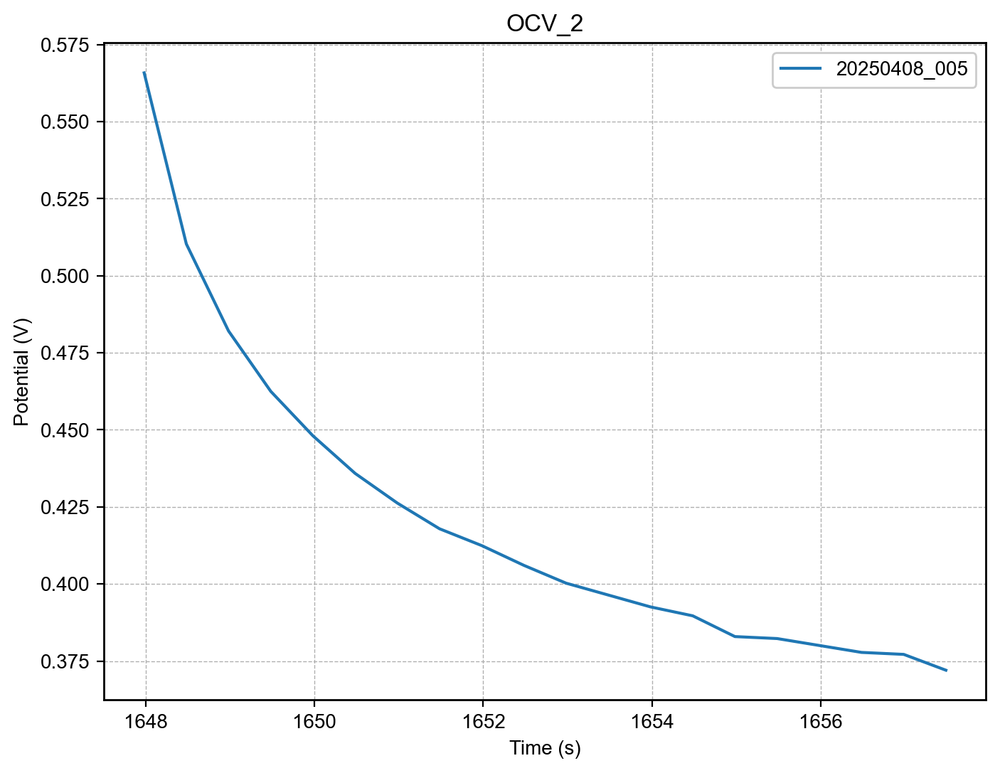

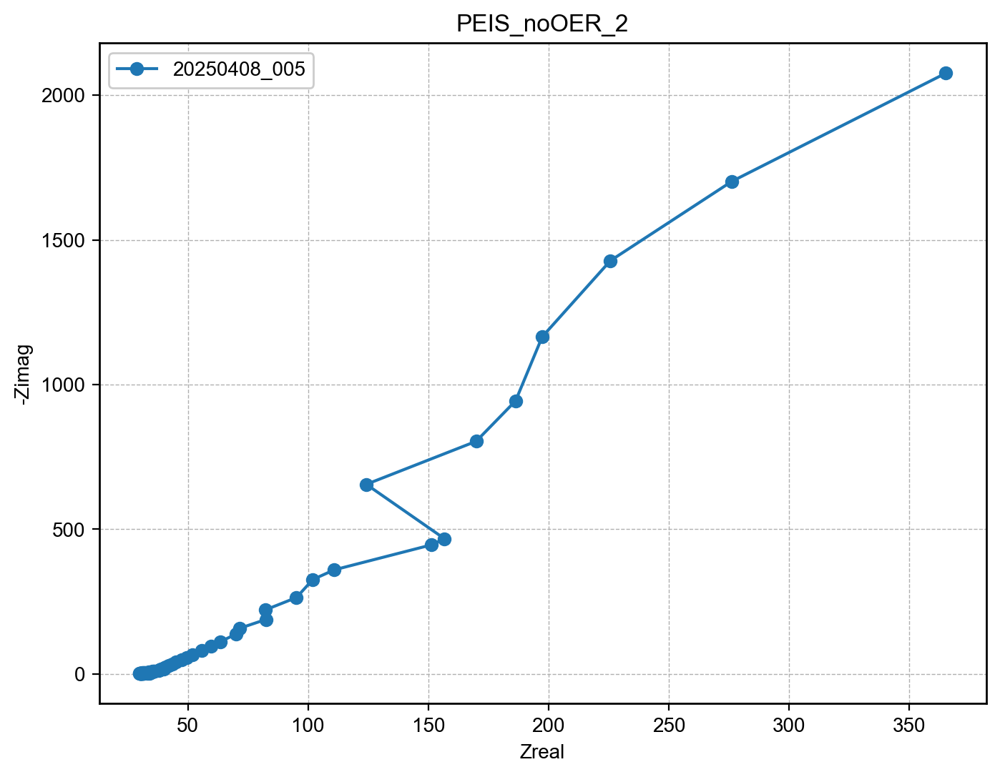

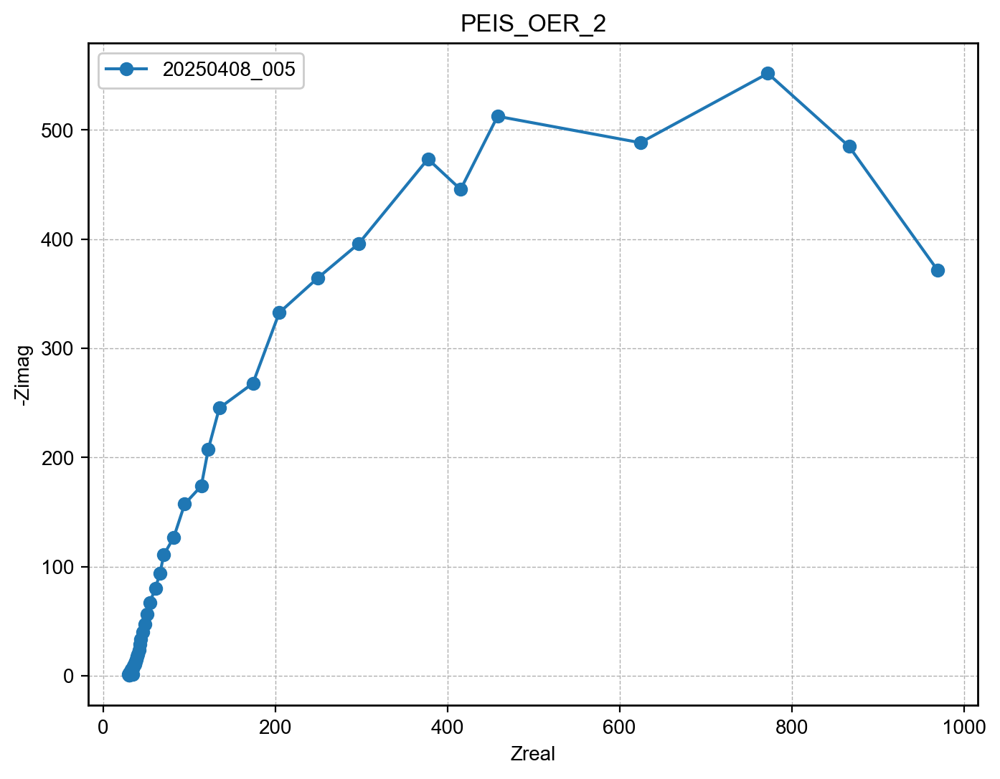

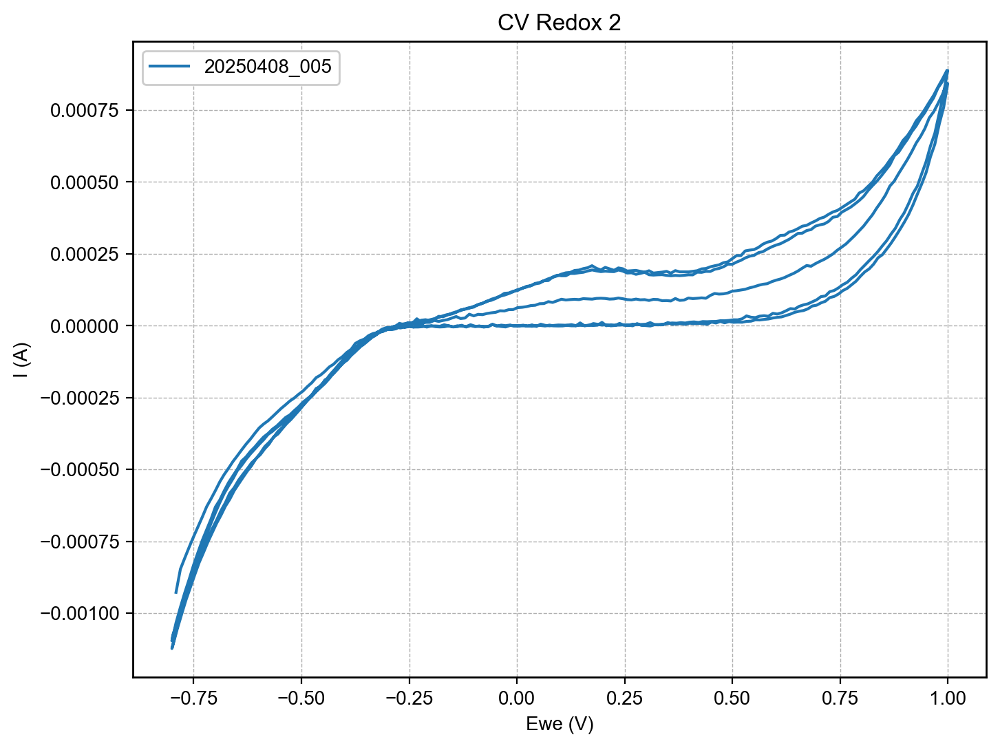

In [724]:
characterization_folder = "/home/runzezhang/Data/OT2/20250408_005/characterization"

df_info = extract_file_info(characterization_folder)
df_info = add_custom_labels(df_info)
plot_all(df_info, characterization_folder, sample_id ="20250408_005", save=False, plot=True, cva_last_cycle_only=True)

### Data process (information extraction)

In [725]:
sample_id = "20250408_005"

data_path = f"/home/runzezhang/Data/OT2/20250409_Parameter_test"
test_peis = os.path.join(data_path,f"{sample_id}/characterization/{sample_id}_17_peis.csv")
test_lsv = os.path.join(data_path, f"{sample_id}/characterization/{sample_id}_20_lp.csv")


Refining Initial Guess:   0%|          | 0/1 [00:00<?, ?it/s]

Running Bayesian Inference:   0%|          | 0/1 [00:00<?, ?it/s]

<Figure size 1400x1200 with 0 Axes>

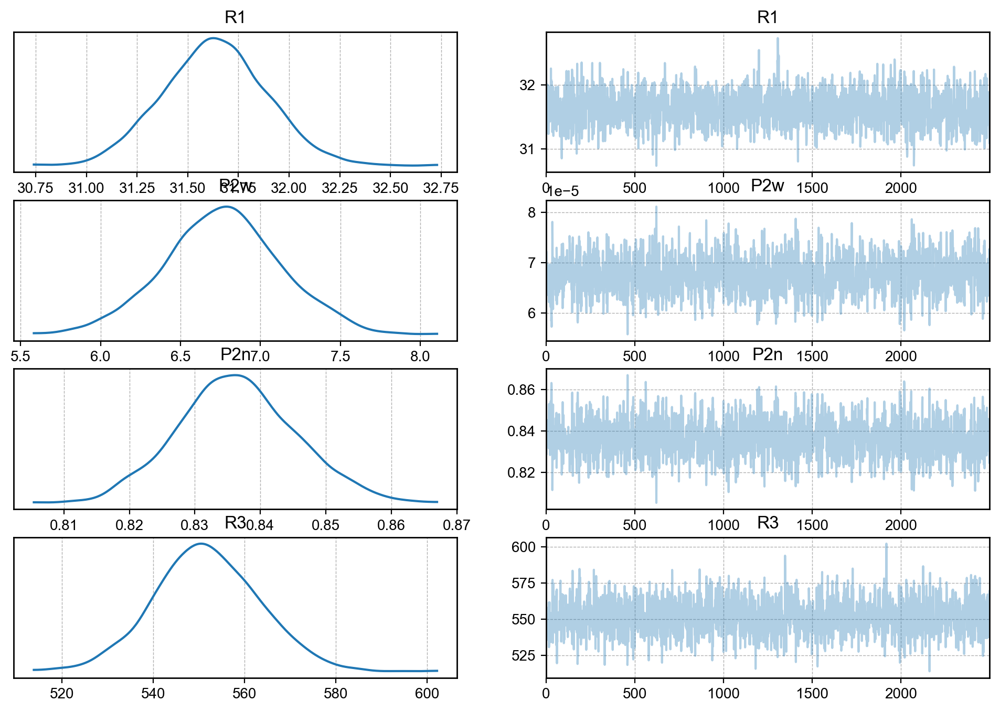

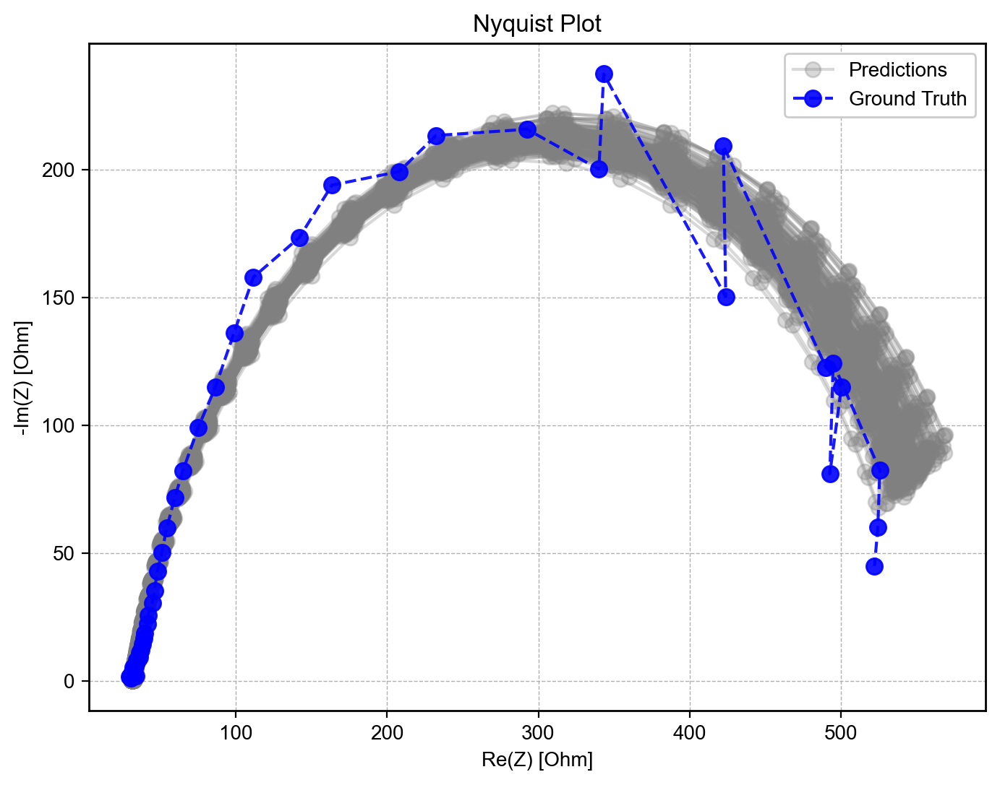

              Rs_mean               Rs_std             Cdl-Q_mean  \
0  31.633040454904968  0.25708392806723623  6.764679067770821e-05   

                Cdl-Q_std      Cdl-alpha_mean         Cdl-alpha_std  \
0  3.6191594601505537e-06  0.8364178089432518  0.008923541515910358   

            Rct_mean             Rct_std  
0  551.6414108859194  11.459931322422934  


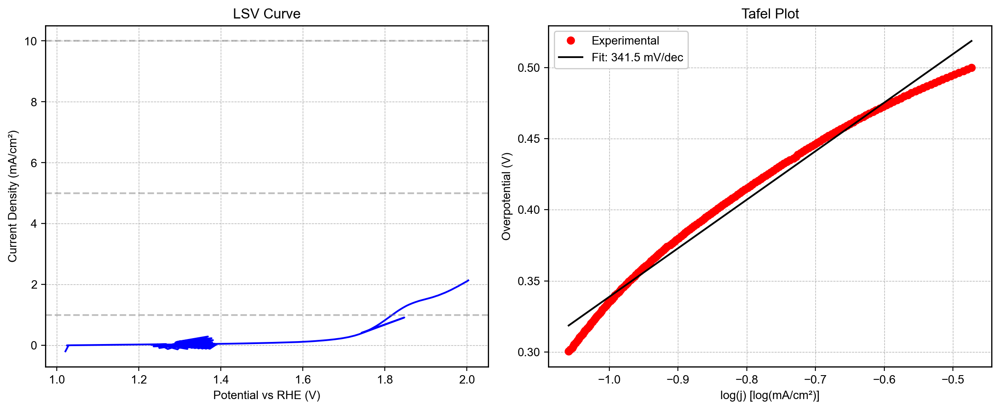

     pH  electrode_area    op_1mA    op_5mA   op_10mA  slope_mVdec  j0_mA_cm2  \
0  14.0          0.2827  0.587601  1.980484  4.087901   341.472472   0.010189   

   tafel_r2  
0  0.980854  


In [726]:

test_peis_results = process_peis(pd.read_csv(test_peis), plot=True, filename="processed_peis.png", folder= data_path + f"/{sample_id}", save=False)
print(test_peis_results)
test_lsv_results = process_lsv(pd.read_csv(test_lsv), R_solution= test_peis_results['Rs_mean'].values[0], pH=14.0, electrode_area=0.2827, E_Ref = 1.23, plot=True, filename="processed_lsv.png", folder=data_path + f"/{sample_id}", save=False)
print(test_lsv_results)
# Combine all results
results = pd.concat([test_peis_results, test_lsv_results], axis=1)

# insert sample ID
results.insert(0, 'Sample_ID', sample_id)

results.to_csv(data_path + f"/{sample_id}" + "/results.csv", index=False)



#### Results analysis

In [ ]:
def concat_all_results_csv(base_dir, save_path=None):
    """
    Recursively searches for 'results.csv' in all subdirectories under base_dir,
    reads them, concatenates them into a single DataFrame, and optionally saves it.

    Parameters:
    - base_dir (str): Path to the base directory to search.
    - save_path (str, optional): If provided, the concatenated DataFrame will be saved to this path.

    Returns:
    - pd.DataFrame: The concatenated DataFrame.
    """
    all_csv_paths = []
    
    # Walk through all subdirectories
    for root, dirs, files in os.walk(base_dir):
        for file in files:
            if file == "results.csv":
                all_csv_paths.append(os.path.join(root, file))
    
    if not all_csv_paths:
        print("No 'results.csv' files found.")
        return pd.DataFrame()
    
    # Read and concatenate all found CSV files
    df_list = [pd.read_csv(csv_path) for csv_path in all_csv_paths]
    combined_df = pd.concat(df_list, ignore_index=True)
    
    # Save if a path is provided
    if save_path:
        combined_df.to_csv(save_path, index=False)
        print(f"Combined CSV saved to: {save_path}")
    
    return combined_df

In [721]:
batch_8 = concat_all_results_csv("/home/runzezhang/Data/OT2/20250409_Parameter_test")
batch_7 = concat_all_results_csv("/home/runzezhang/Data/OT2/20250407_Parameter_test")
batch_6 = concat_all_results_csv("/home/runzezhang/Data/OT2/20250405_Parameter_test")

In [722]:
results_0408 = pd.concat([batch_6, batch_7, batch_8], axis=0)
results_0408.head()

,Sample_ID,Rs_mean,Rs_std,Cdl-Q_mean,Cdl-Q_std,Cdl-alpha_mean,Cdl-alpha_std,Rct_mean,Rct_std,pH,electrode_area,op_1mA,op_5mA,op_10mA,slope_mVdec,j0_mA_cm2,tafel_r2
0,20250403_004,33.092607,0.670965,0.000053,0.000003,0.624719,0.007851,2617.372956,120.466321,14.0,0.2827,0.874108,5.410066,11.080015,628.898147,0.029840,0.995434
1,20250404_008,35.233918,0.135041,0.011930,0.005487,0.741660,0.093943,7.634018,2.267171,14.0,0.2827,0.129528,0.335881,0.361768,98.818120,0.002064,0.992229
2,20250405_014,32.847560,0.222279,0.000070,0.000003,0.862738,0.008270,510.799178,9.438740,14.0,0.2827,0.600797,2.334571,4.845195,379.624780,0.021018,0.983326
3,20250404_009,33.975472,0.127829,0.012648,0.004706,0.897479,0.078732,4.573337,1.109935,14.0,0.2827,0.117010,0.138386,0.359773,114.423049,0.007212,0.993524
4,20250403_002,29.943704,1.102640,0.000061,0.000006,0.577286,0.012408,1546.538221,79.544322,14.0,0.2827,0.692816,2.878540,5.964718,313.140276,0.005594,0.978272


#### Data process

In [ ]:
# encode specific reaction parameters for all samples
batch6_parameters_dict = {
    "Sample_ID": ["20250402_000", "20250402_001", "20250403_002", "20250403_003", "20250403_004", "20250403_005", "20250403_006", "20250403_007", "20250404_008", "20250404_009", "20250404_010", "20250404_013", "20250405_014"],
    "Materials": ["Fe", "Fe", "Fe", "Fe", "Fe", "Fe", "Fe", "Ni", "Ni", "Ni", "Fe", "Fe", "Fe"],
    "Composition_type":['Monometallic']*13,
    "Washing": ["Water", "Acid", "Acid", "Acid", "Acid", "Acid", "Water", "Water", "Water", "Water", "Acid", "Acid", "Acid"],
    "Deposition Current (mA)": [-2, -2, -2, -2, -2, -4, -4, -4, -2, -2, -50, -2, -2],
    "Deposition Time (s)": [60, 60, 60, 120, 120, 120, 120, 120, 60, 60, 60, 60, 60],
    "Solution_Ph": [2.4, 2.4, 2.4, 2.4, 2.4, 2.4, 2.4, 2.4, 2.4, 7.0, 2.4, 2.4, 2.4],
    "E_start (V)": [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1.25, 1.25],
    "E_vertex (V)": [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1.3, 1.3],
    "num_of_cycles": [5]*11 + [60]*2,  # Not explicitly given, assumed None
    "Complexing Agent": ["-"]*12 + ["Citric Acid"],
    "Complexing Ratio": ["-"]*12 + ["1:1"],
    "Arduino Functionality": [
        "Wash x", "Relay x", "-", "Pipette x", "-", "Sonicator x", "Sonicator x",
        "-", "Sonicator x", "Rinse x", "Sonicator x", "Sonicator x", "Sonicator x"
    ]
}

batch6_parameters_df = pd.DataFrame(batch6_parameters_dict)
# batch6_parameters_df.to_csv("/home/runzezhang/Data/OT2/20250405_Parameter_test/batch6_parameters.csv", index=False)

In [ ]:
# Manually constructing the DataFrame from the second image
batch7_parameters_dict = {
    "Sample_ID": ["20250405_000", "20250405_001", "20250405_002", "20250405_003", "20250406_004", "20250406_005", "20250406_006", "20250406_007", "20250406_008", "20250406_009", "20250407_010", "20250407_011", "20250407_012", "20250407_013", "20250407_014"],
    "Materials": ["Fe, Ni", "Fe, Ni", "Fe, Ni", "Fe, Ni", "Fe, Ni", "Fe, Ni", "Fe, Ni", "Fe, Ni, Water", "Fe", "Fe, Ni, Water", "Fe, Water", "Fe, HNO3", "Ni", "Ni", "Ni"],
    "Composition_type": ['Bimetallic'] * 8 + ['Monometallic'] + ['Bimetallic'] + ['Monometallic'] * 5,
    "Washing": ["Acid"] * 15,
    "Ratio": ["1:1", "1:2", "2:1", "1:1", "1:1", "1:1", "1:1", "1:1:2", "-", "1:1:2", "1:1", "1:1", "-", "-", "-"],
    "Deposition Current (mA)": [-2, -2, -2, -50, -50, -2, -2, -50, -50, -50, -2, -2, -2, -2, -10],
    "Deposition Time (s)": [60, 60, 60, 60, 60, 60, 240, 60, 60, 60, 60, 60, 60, 120, 60],
    "Solution_Ph": [2.4] * 15,
    "E_start (V)": [1.25] * 15,
    "E_vertex (V)": [1.3] * 15,
    "num_of_cycles": [60] * 15,
    "Complexing Agent": [
        "Citric Acid", "Citric Acid", "Citric Acid", "Citric Acid", "-", "-", "-", "-", "C6H9N3O9", 
        "C6H9N3O9", "C6H9N3O9", "C6H9N3O9", "-", "-", "-"
    ],
    "Complexing Ratio": ["1:1"]*4 + [None]*4 + ["1:1"]*4 + [None]*3,
    "Arduino Functionality": [
        "Sonicator x", "Sonicator x", "Sonicator x", "Sonicator x", "Sonicator x", "Sonicator x", 
        "Sonicator x", "Sonicator x", "Sonicator x", "Sonicator x", "√", "√", "√", "√", "√"
    ]
}

batch7_parameters_df = pd.DataFrame(batch7_parameters_dict)
# batch7_parameters_df.to_csv("/home/runzezhang/Data/OT2/20250407_Parameter_test/batch7_parameters.csv", index=False)


In [ ]:
# Manually reconstruct the DataFrame based on the provided image
batch8_parameters_dict = {
    "Reactor_ID": ["20250408_000", "20250408_001", "20250408_002", "20250408_003", "20250408_004", "20250408_005", "20250408_006"],
    "Materials": ["Fe", "Fe", "Fe, HNO3", "Fe, HNO3", "Fe, Ni, HNO3", "Fe", "Fe"],
    "Washing": ["Acid"] * 7,
    "Ratio": ["-", "-", "1:1", "1:2", "1:1:2", "-", "-"],
    "Deposition Current (mA)": [-10, -2, -2, -2, -50, -50, -50],
    "Deposition Time (s)": [60, 120, 60, 60, 60, 60, 240],
    "pH": [2.4] * 7,
    "最低voltage (V)": [1.25] * 7,
    "最高voltage (V)": [1.3] * 7,
    "num_of_cycles": [None] * 7,
    "Complexing Agent": ["-"] * 7,
    "Arduino Functionality": ["√"] * 7
}

df3 = pd.DataFrame(data3)
batch7_parameters_df = pd.DataFrame(batch7_parameters_dict)
# batch7_parameters_df.to_csv("/home/runzezhang/Data/OT2/20250407_Parameter_test/batch7_parameters.csv", index=False)


In [678]:
b67 = pd.concat([batch6_parameters_df, batch7_parameters_df], ignore_index=True)
b67.to_csv("/home/runzezhang/Data/OT2/b67_parameters.csv", index=False)

In [679]:
# merge 2 df according to Sample_ID
B67_df = b67.merge(results_0408, on="Sample_ID", how="left")
B67_df.head()

,Sample_ID,Materials,Composition_type,Washing,Deposition Current (mA),Deposition Time (s),Solution_Ph,E_start (V),E_vertex (V),num_of_cycles,...,Rct_mean,Rct_std,pH,electrode_area,op_1mA,op_5mA,op_10mA,slope_mVdec,j0_mA_cm2,tafel_r2
0,20250402_000,Fe,Monometallic,Water,-2,60,2.4,0.0,1.0,5,...,3544.034237,1.472284e+02,14.0,0.2827,1.238297,7.162661,14.568116,720.262573,0.029822,0.996547
1,20250402_001,Fe,Monometallic,Acid,-2,60,2.4,0.0,1.0,5,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,20250403_002,Fe,Monometallic,Acid,-2,60,2.4,0.0,1.0,5,...,1546.538221,7.954432e+01,14.0,0.2827,0.692816,2.878540,5.964718,313.140276,0.005594,0.978272
3,20250403_003,Fe,Monometallic,Acid,-2,120,2.4,0.0,1.0,5,...,161389.196571,2.285893e+06,14.0,0.2827,0.759047,2.152187,3.927765,746.352733,0.046603,0.998339
4,20250403_004,Fe,Monometallic,Acid,-2,120,2.4,0.0,1.0,5,...,2617.372956,1.204663e+02,14.0,0.2827,0.874108,5.410066,11.080015,628.898147,0.029840,0.995434


In [673]:
B67_df.to_csv("/home/runzezhang/Data/OT2/b67_all.csv", index=False)

#### Data Analysis

In [681]:
B67_df.head()

,Sample_ID,Materials,Composition_type,Washing,Deposition Current (mA),Deposition Time (s),Solution_Ph,E_start (V),E_vertex (V),num_of_cycles,...,Rct_mean,Rct_std,pH,electrode_area,op_1mA,op_5mA,op_10mA,slope_mVdec,j0_mA_cm2,tafel_r2
0,20250402_000,Fe,Monometallic,Water,-2,60,2.4,0.0,1.0,5,...,3544.034237,1.472284e+02,14.0,0.2827,1.238297,7.162661,14.568116,720.262573,0.029822,0.996547
1,20250402_001,Fe,Monometallic,Acid,-2,60,2.4,0.0,1.0,5,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,20250403_002,Fe,Monometallic,Acid,-2,60,2.4,0.0,1.0,5,...,1546.538221,7.954432e+01,14.0,0.2827,0.692816,2.878540,5.964718,313.140276,0.005594,0.978272
3,20250403_003,Fe,Monometallic,Acid,-2,120,2.4,0.0,1.0,5,...,161389.196571,2.285893e+06,14.0,0.2827,0.759047,2.152187,3.927765,746.352733,0.046603,0.998339
4,20250403_004,Fe,Monometallic,Acid,-2,120,2.4,0.0,1.0,5,...,2617.372956,1.204663e+02,14.0,0.2827,0.874108,5.410066,11.080015,628.898147,0.029840,0.995434


In [727]:
B67_df

,Sample_ID,Materials,Composition_type,Washing,Deposition Current (mA),Deposition Time (s),Solution_Ph,E_start (V),E_vertex (V),num_of_cycles,...,Rct_mean,Rct_std,pH,electrode_area,op_1mA,op_5mA,op_10mA,slope_mVdec,j0_mA_cm2,tafel_r2
0,20250402_000,Fe,Monometallic,Water,-2,60,2.4,0.00,1.0,5,...,3544.034237,1.472284e+02,14.0,0.2827,1.238297,7.162661,14.568116,720.262573,0.029822,0.996547
1,20250402_001,Fe,Monometallic,Acid,-2,60,2.4,0.00,1.0,5,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,20250403_002,Fe,Monometallic,Acid,-2,60,2.4,0.00,1.0,5,...,1546.538221,7.954432e+01,14.0,0.2827,0.692816,2.878540,5.964718,313.140276,0.005594,0.978272
3,20250403_003,Fe,Monometallic,Acid,-2,120,2.4,0.00,1.0,5,...,161389.196571,2.285893e+06,14.0,0.2827,0.759047,2.152187,3.927765,746.352733,0.046603,0.998339
4,20250403_004,Fe,Monometallic,Acid,-2,120,2.4,0.00,1.0,5,...,2617.372956,1.204663e+02,14.0,0.2827,0.874108,5.410066,11.080015,628.898147,0.029840,0.995434
5,20250403_005,Fe,Monometallic,Acid,-4,120,2.4,0.00,1.0,5,...,2450.346227,2.901280e+02,14.0,0.2827,-0.858577,4.061824,10.212326,1808.283627,0.452591,0.989169
6,20250403_006,Fe,Monometallic,Water,-4,120,2.4,0.00,1.0,5,...,1332.528147,2.899726e+01,14.0,0.2827,0.676164,2.825823,5.880412,634.269785,0.067467,0.979147
7,20250403_007,Ni,Monometallic,Water,-4,120,2.4,0.00,1.0,5,...,1.721420,1.615765e+01,14.0,0.2827,0.099093,0.117015,0.298694,103.230416,0.012096,0.906888
8,20250404_008,Ni,Monometallic,Water,-2,60,2.4,0.00,1.0,5,...,7.634018,2.267171e+00,14.0,0.2827,0.129528,0.335881,0.361768,98.818120,0.002064,0.992229
9,20250404_009,Ni,Monometallic,Water,-2,60,7.0,0.00,1.0,5,...,4.573337,1.109935e+00,14.0,0.2827,0.117010,0.138386,0.359773,114.423049,0.007212,0.993524


In [728]:
results_0408

,Sample_ID,Rs_mean,Rs_std,Cdl-Q_mean,Cdl-Q_std,Cdl-alpha_mean,Cdl-alpha_std,Rct_mean,Rct_std,pH,electrode_area,op_1mA,op_5mA,op_10mA,slope_mVdec,j0_mA_cm2,tafel_r2
0,20250403_004,33.092607,0.670965,0.000053,0.000003,0.624719,0.007851,2617.372956,1.204663e+02,14.0,0.2827,0.874108,5.410066,11.080015,628.898147,0.029840,0.995434
1,20250404_008,35.233918,0.135041,0.011930,0.005487,0.741660,0.093943,7.634018,2.267171e+00,14.0,0.2827,0.129528,0.335881,0.361768,98.818120,0.002064,0.992229
2,20250405_014,32.847560,0.222279,0.000070,0.000003,0.862738,0.008270,510.799178,9.438740e+00,14.0,0.2827,0.600797,2.334571,4.845195,379.624780,0.021018,0.983326
3,20250404_009,33.975472,0.127829,0.012648,0.004706,0.897479,0.078732,4.573337,1.109935e+00,14.0,0.2827,0.117010,0.138386,0.359773,114.423049,0.007212,0.993524
4,20250403_002,29.943704,1.102640,0.000061,0.000006,0.577286,0.012408,1546.538221,7.954432e+01,14.0,0.2827,0.692816,2.878540,5.964718,313.140276,0.005594,0.978272
5,20250403_003,30.871908,0.902105,0.000117,0.000015,0.663497,0.020326,161389.196571,2.285893e+06,14.0,0.2827,0.759047,2.152187,3.927765,746.352733,0.046603,0.998339
6,20250404_013,33.790369,0.187526,0.000075,0.000004,0.869269,0.008844,247.030494,3.260005e+00,14.0,0.2827,0.530737,1.647264,3.514581,305.058137,0.013713,0.969829
7,20250403_006,35.143268,0.588786,0.000024,0.000002,0.715100,0.008504,1332.528147,2.899726e+01,14.0,0.2827,0.676164,2.825823,5.880412,634.269785,0.067467,0.979147
8,20250403_007,35.340861,0.114348,0.021929,0.028163,0.852748,0.117315,1.721420,1.615765e+01,14.0,0.2827,0.099093,0.117015,0.298694,103.230416,0.012096,0.906888
9,20250404_010,31.093693,1.043885,0.000035,0.000003,0.619385,0.010385,2004.907348,8.141277e+01,14.0,0.2827,0.779536,4.779513,9.818351,908.019420,0.081174,0.999623


In [ ]:
def rank_and_plot_op_10mA(data: pd.DataFrame):
    """
    Ranks samples by 'op_10mA' and plots a bar chart with different colors 
    for Monometallic-Ni, Monometallic-Fe, and Bimetallic samples.

    Parameters:
    -----------
    data : pd.DataFrame
        Must contain columns 'Sample_ID', 'op_10mA', 'Materials', and 'Composition_type'.
    """

    # Drop rows with missing values in required columns
    data_clean = data.dropna(subset=['Sample_ID', 'op_10mA', 'Materials', 'Composition_type'])

    # Classify into 3 groups
    def classify(material_str, comp_type):
        if comp_type.lower() == 'monometallic':
            if 'Ni' in material_str and 'Fe' not in material_str:
                return 'Monometallic-Ni'
            elif 'Fe' in material_str and 'Ni' not in material_str:
                return 'Monometallic-Fe'
            else:
                return 'Other Monometallic'
        elif comp_type.lower() == 'bimetallic':
            return 'Bimetallic'
        else:
            return 'Other'

    data_clean['Material_Class'] = data_clean.apply(
        lambda row: classify(row['Materials'], row['Composition_type']), axis=1
    )

    # Filter only the three desired classes
    data_clean = data_clean[data_clean['Material_Class'].isin(['Monometallic-Ni', 'Monometallic-Fe', 'Bimetallic'])]

    # Sort by 'op_10mA'
    data_sorted = data_clean.sort_values(by='op_10mA', ascending=True).reset_index(drop=True)

    # Define color map
    color_map = {
        'Monometallic-Ni': 'dodgerblue',
        'Monometallic-Fe': 'firebrick',
        'Bimetallic': 'mediumseagreen',
    }
    colors = data_sorted['Material_Class'].map(color_map)

    # Plot
    plt.figure(figsize=(12, 6))
    bars = plt.bar(data_sorted['Sample_ID'].astype(str), data_sorted['op_10mA'], color=colors)

    # Add value labels
    for bar, value in zip(bars, data_sorted['op_10mA']):
        plt.text(bar.get_x() + bar.get_width() / 2, bar.get_height(),
                 f'{value:.2f}', ha='center', va='bottom', fontsize=8)

    # Axis and formatting
    plt.xticks(rotation=45, ha='right')
    plt.xlabel('Sample ID')
    plt.ylabel('op_10mA')
    plt.title('Samples Ranked by op_10mA')
    plt.tight_layout()

    # Add custom legend
    from matplotlib.patches import Patch
    legend_elements = [Patch(facecolor=color_map[key], label=key) for key in color_map]
    plt.legend(handles=legend_elements, title='Material Class')

    plt.show()

In [696]:
from matplotlib.patches import Patch


In [697]:
def rank_and_plot_op_10mA(data: pd.DataFrame):
    """
    Ranks samples by 'op_10mA' and plots a bar chart with different colors 
    for Monometallic-Ni, Monometallic-Fe, and Bimetallic samples.
    Marks samples with vertex voltage != 1.3 as "Low Activation Voltage".

    Parameters:
    -----------
    data : pd.DataFrame
        Must contain columns: 'Sample_ID', 'op_10mA', 'Materials', 'Composition_type', and 'E_vertex (V)'.
    """

    # Drop rows with missing values in required columns
    data_clean = data.dropna(subset=['Sample_ID', 'op_10mA', 'Materials', 'Composition_type', 'E_vertex (V)'])

    # Classify into 3 groups
    def classify(material_str, comp_type):
        if comp_type.lower() == 'monometallic':
            if 'Ni' in material_str and 'Fe' not in material_str:
                return 'Monometallic-Ni'
            elif 'Fe' in material_str and 'Ni' not in material_str:
                return 'Monometallic-Fe'
            else:
                return 'Other Monometallic'
        elif comp_type.lower() == 'bimetallic':
            return 'Bimetallic'
        else:
            return 'Other'

    data_clean['Material_Class'] = data_clean.apply(
        lambda row: classify(row['Materials'], row['Composition_type']), axis=1
    )

    # Filter only the three desired classes
    valid_classes = ['Monometallic-Ni', 'Monometallic-Fe', 'Bimetallic']
    data_clean = data_clean[data_clean['Material_Class'].isin(valid_classes)]

    # Sort by 'op_10mA'
    data_sorted = data_clean.sort_values(by='op_10mA', ascending=True).reset_index(drop=True)

    # Define color map
    color_map = {
        'Monometallic-Ni': 'dodgerblue',
        'Monometallic-Fe': 'firebrick',
        'Bimetallic': 'mediumseagreen',
    }
    colors = data_sorted['Material_Class'].map(color_map)

    # Plot
    plt.figure(figsize=(13, 6))
    bars = plt.bar(data_sorted['Sample_ID'].astype(str), data_sorted['op_10mA'], color=colors)

    # Add value labels and voltage warnings
    for bar, value, voltage in zip(bars, data_sorted['op_10mA'], data_sorted['E_vertex (V)']):
        x_pos = bar.get_x() + bar.get_width() / 2
        y_pos = bar.get_height()

        # Value label
        plt.text(x_pos, y_pos, f'{value:.2f}', ha='center', va='bottom', fontsize=8)

        # Mark low activation voltage
        if round(voltage, 2) != 1.3:
            plt.text(x_pos, y_pos + 0.05 * max(data_sorted['op_10mA']),
                     '⚠ Low Act. V', ha='center', va='bottom', fontsize=8, color='crimson')

    # Axis and formatting
    plt.xticks(rotation=45, ha='right')
    plt.xlabel('Sample ID')
    plt.ylabel('op_10mA')
    plt.title('Samples Ranked by op_10mA')
    plt.tight_layout()

    # Add custom legend
    legend_elements = [Patch(facecolor=color_map[key], label=key) for key in color_map]
    legend_elements.append(Patch(facecolor='white', edgecolor='crimson', label='⚠ Low Activation Voltage'))
    plt.legend(handles=legend_elements, title='Material Class', loc='best')

    plt.show()

/tmp/ipykernel_1329006/2774237528.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_clean['Material_Class'] = data_clean.apply(
INFO:matplotlib.category:Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
INFO:matplotlib.category:Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.


/tmp/ipykernel_1329006/2774237528.py:71: UserWarning: Glyph 9888 (\N{WARNING SIGN}) missing from current font.
  plt.tight_layout()
/home/runzezhang/miniforge3/envs/autoeis/lib/python3.10/site-packages/IPython/core/pylabtools.py:152: UserWarning: Glyph 9888 (\N{WARNING SIGN}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


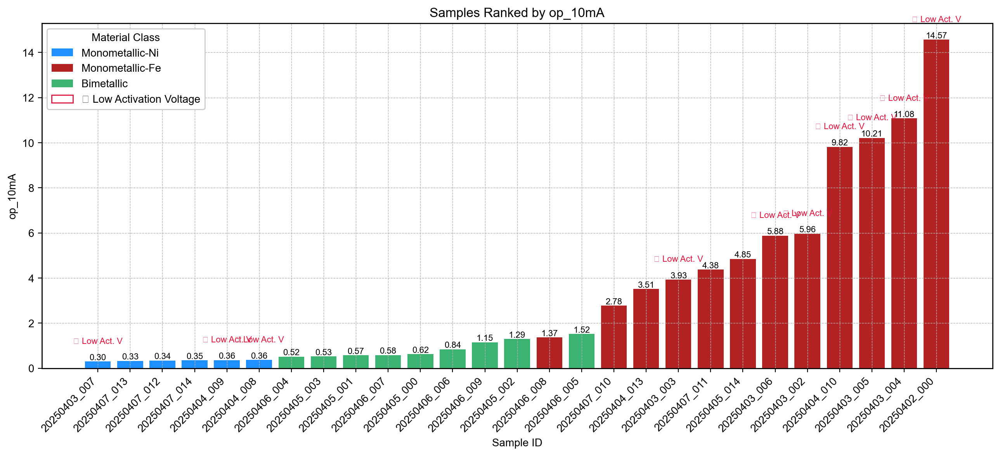

In [698]:
rank_and_plot_op_10mA(B67_df)

In [686]:
B67_df[B67_df['Sample_ID']=='20250406_008']

,Sample_ID,Materials,Composition_type,Washing,Deposition Current (mA),Deposition Time (s),Solution_Ph,E_start (V),E_vertex (V),num_of_cycles,...,Rct_mean,Rct_std,pH,electrode_area,op_1mA,op_5mA,op_10mA,slope_mVdec,j0_mA_cm2,tafel_r2
21,20250406_008,Fe,Monometallic,Acid,-50,60,2.4,1.25,1.3,60,...,223.210661,2.797315,14.0,0.2827,0.448949,0.667508,1.366373,173.681562,0.002491,0.995838
